In [1]:
pip install pandas unicode matplotlib seaborn scikit-learn nltk plotly scipy ipywidgets 


Note: you may need to restart the kernel to use updated packages.


In [3]:
import os

# Set LOKY_MAX_CPU_COUNT environment variable to the number of cores you want to use
os.environ['LOKY_MAX_CPU_COUNT'] = '4'  # Example: Use 4 cores

In [4]:
import pandas as pd
pd.set_option("mode.copy_on_write", True)

# 1. FINAL INTEGRATION PIPELINE 

In [5]:
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import IsolationForest
from sklearn.ensemble import IsolationForest
import numpy as np
import os
import unicodedata
import nltk
import string
from nltk.corpus import stopwords


def process_customer_data(sector_filepath, data_directory, output_filepath=None):
    """
    Process customer data by reading sector information, normalizing and mapping sectors,
    and combining customer data files into a single DataFrame.

    Parameters:
    - sector_filepath (str): Path to the sector economic data CSV file.
    - data_directory (str): Directory containing customer data CSV files.
    - output_filepath (str, optional): Path to save the combined DataFrame as a CSV file. If None, the file is not saved.

    Returns:
    - pd.DataFrame: Combined DataFrame with customer and sector economic data.
    """
    def normalize_text(text):
        """
        Strip accents from input String, remove stopwords, and join words with underscores.

        :param text: The input string.
        :type text: String.

        :returns: The processed String.
        :rtype: String.
        """
        # Remove accents
        text = unicodedata.normalize('NFD', text).encode('ascii', 'ignore').decode('utf-8')
        
        # Remove punctuation
        translator = str.maketrans('', '', string.punctuation)
        text = text.translate(translator)
        
        # Remove stopwords and join words with underscores
        words = text.split()
        filtered_words = [word for word in words if word.lower() not in stop_words]
        return '_'.join(filtered_words)
    
    nltk.download('stopwords')

    # Spanish  stopwords
    stop_words = set(stopwords.words('spanish'))
    sector_df = pd.read_csv(sector_filepath, encoding='ISO-8859-1')
    sector_df['sector_economico_normalizado'] = sector_df['Sector Economico'].map(lambda x: normalize_text(x).lower())

    # Create a mapping from Cliente to normalized sector
    sector_mapping = sector_df.set_index('Cliente')['sector_economico_normalizado'].to_dict()

    dataframes = []
    for filename in os.listdir(data_directory):
        if filename.startswith("DATOSCLIENTE") and filename.endswith('.csv'):
            filepath = os.path.join(data_directory, filename)
            
            customer_id = int(filename.replace('DATOSCLIENTE', '').replace('.csv', ''))
            df = pd.read_csv(filepath)
            df['ClienteId'] = customer_id
            dataframes.append(df)

    combined_df = pd.concat(dataframes, ignore_index=True)
    combined_df['Sector_Economico'] = combined_df['ClienteId'].map(lambda x: sector_mapping.get(f'Cliente {x} '))

    if output_filepath:
        combined_df.to_csv(output_filepath, index=False)
        print(f'Combined dataset saved to {output_filepath}')

    return combined_df

def add_new_features(df, output_filepath):
    """
    Add new features to the DataFrame and save the processed DataFrame to a CSV file.

    This function performs the following operations:
    1. Converts the 'Fecha' column to datetime.
    2. Calculates the 'Factor_Potencia' using the 'Active_energy' and 'Reactive_energy' columns.
    3. Extracts time components such as day of the week, hour, and month.
    4. Applies cyclic coding to the extracted time components.
    5. Saves the processed DataFrame to the specified output file.

    Parameters:
    - df (pd.DataFrame): The input DataFrame containing the original data.
    - output_filepath (str): The path to save the processed DataFrame as a CSV file.

    Returns:
    - pd.DataFrame: The processed DataFrame with new features added.
    """
    
    # Convert 'Fecha' column to datetime
    df['Fecha'] = pd.to_datetime(df['Fecha'])

    # Calculate Factor_Potencia
    epsilon = 1e-10
    denominador = np.sqrt(np.square(df['Active_energy']) + np.square(df['Reactive_energy'])) + epsilon
    df['Factor_Potencia'] = df['Active_energy'] / denominador

    # Extract time components
    df['DiaSemana'] = df['Fecha'].dt.dayofweek  # Mon=0, Sun=6
    df['Hora'] = df['Fecha'].dt.hour
    df['Mes'] = df['Fecha'].dt.month

    # Time Cyclic Coding
    df['Dia_Sin'] = np.sin(df['DiaSemana'] * (2. * np.pi / 7))
    df['Dia_Cos'] = np.cos(df['DiaSemana'] * (2. * np.pi / 7))
    df['Hora_Sin'] = np.sin(df['Hora'] * (2. * np.pi / 24))
    df['Hora_Cos'] = np.cos(df['Hora'] * (2. * np.pi / 24))
    df['Mes_Sin'] = np.sin((df['Mes'] - 1) * (2. * np.pi / 12))
    df['Mes_Cos'] = np.cos((df['Mes'] - 1) * (2. * np.pi / 12))

    # Save the processed DataFrame to a CSV file
    df.to_csv(output_filepath, index=False)
    print(f'Combined dataset saved to {output_filepath}')
    
    return df





def get_anomalies(df, contamination=0.05):
    """
    Identify anomalies in a given DataFrame using the Isolation Forest algorithm.

    Parameters:
    - df (pd.DataFrame): The input DataFrame to analyze for anomalies.
    - contamination (float, optional): The proportion of outliers in the data set. Defaults to 0.05.

    Returns:
    - pd.DataFrame: A DataFrame with additional columns 'Anomaly' and 'Anomaly_Score'.
    """
    
    # Create a deep copy of the DataFrame
    df_copy = df.copy()
    
    # Initialize Isolation Forest model
    iso_forest = IsolationForest(n_estimators=100, contamination=contamination, random_state=42)
    
    # Fit the model
    iso_forest.fit(df_copy)
    
    # Predict anomalies
    preds = iso_forest.predict(df_copy)
    
    # Score anomalies
    anomaly_score = iso_forest.decision_function(df_copy)
    
    # Update the DataFrame with anomaly predictions and scores
    df_copy['Anomaly'] = preds
    df_copy['Anomaly_Score'] = anomaly_score
    
    return df_copy


def clustering(df):
    # Standardize features
    features_to_scale = ['Active_energy', 'Reactive_energy', 'Voltaje_FA', 'Voltaje_FC', 'Factor_Potencia']
    X = df[features_to_scale]
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    
    # Perform clustering
    optimal_k = 4
    kmeans = KMeans(n_clusters=optimal_k, random_state=42)
    kmeans.fit_transform(X_scaled)
    labels = kmeans.labels_
    
    # Add cluster labels to the DataFrame
    df['Cluster'] = labels
    
    return df['Cluster']

def detect_global_anomalies(df):
    # Perform anomaly detection using Isolation Forest
    features = ['Active_energy', 'Reactive_energy', 'Voltaje_FA', 'Voltaje_FC', 'Factor_Potencia']
    time_features = ['Dia_Sin', 'Dia_Cos', 'Hora_Sin', 'Hora_Cos', 'Mes_Sin', 'Mes_Cos']
    final_features = features + time_features
    df['Anomaly'] = pd.NA
    df['Anomaly_Score_Global'] = pd.NA
    
    # Perform anomaly detection
    data = df[final_features]
    data[final_features + ['Anomaly', 'Anomaly_Score_Global']] = get_anomalies(data)
    df.update(data[['Anomaly', 'Anomaly_Score_Global']])
    
    # Rename columns
    df.rename(columns={'Anomaly': 'Anomaly_Global'}, inplace=True)
    
    return df






## 1.1 Pipeline execution

In [6]:
# Pipeline

sector_filepath = '../data/sector_economico_clientes.csv'
data_directory = '../data/'
output_filepath = '../data/output/consumo_datamart_bronze.csv'

# Preprocessing STEP
combined_df = process_customer_data(sector_filepath, data_directory, output_filepath)
output_filepath = '../data/output/consumo_datamart_silver.csv'

# New Features Enrichment STEP (Factor_potenmcia)
combined_df = add_new_features(combined_df, output_filepath)

# Clustering STEP (4 clusters)
combined_df['Cluster'] = clustering(combined_df)

# Anomalies Detecction with a global unique model STEP
combined_df = detect_global_anomalies(combined_df)



combined_df.to_csv('../data/output/consumo_datamart_gold.csv', index=False)
combined_df.head()


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\HP\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


Combined dataset saved to ../data/output/consumo_datamart_bronze.csv
Combined dataset saved to ../data/output/consumo_datamart_silver.csv


,Fecha,Active_energy,Reactive_energy,Voltaje_FA,Voltaje_FC,ClienteId,Sector_Economico,Factor_Potencia,DiaSemana,Hora,Mes,Dia_Sin,Dia_Cos,Hora_Sin,Hora_Cos,Mes_Sin,Mes_Cos,Cluster,Anomaly_Global,Anomaly_Score_Global
0,2021-01-01 00:00:00,0.357841,0.282788,455.139171,510.561002,1,elaboracion_cacao_chocolate_productos_confiteria,0.784582,4,0,1,-0.433884,-0.900969,0.000000,1.000000,0.0,1.0,3,1,0.0831
1,2021-01-01 01:00:00,0.372264,0.431377,469.978787,469.917178,1,elaboracion_cacao_chocolate_productos_confiteria,0.653329,4,1,1,-0.433884,-0.900969,0.258819,0.965926,0.0,1.0,3,1,0.07958
2,2021-01-01 02:00:00,1.044687,0.338626,468.721120,546.949147,1,elaboracion_cacao_chocolate_productos_confiteria,0.951274,4,2,1,-0.433884,-0.900969,0.500000,0.866025,0.0,1.0,3,1,0.093857
3,2021-01-01 03:00:00,0.566425,0.495791,452.329255,444.122989,1,elaboracion_cacao_chocolate_productos_confiteria,0.752465,4,3,1,-0.433884,-0.900969,0.707107,0.707107,0.0,1.0,3,1,0.088716
4,2021-01-01 04:00:00,1.080556,0.472018,513.477596,535.463719,1,elaboracion_cacao_chocolate_productos_confiteria,0.916383,4,4,1,-0.433884,-0.900969,0.866025,0.500000,0.0,1.0,3,1,0.099497


In [8]:
combined_df = pd.read_csv('../data/output/consumo_datamart_gold.csv')
combined_df = combined_df[combined_df['ClienteId']==2]
anomaly_percentage = combined_df[combined_df['Anomaly_Global'] == -1].shape[0]*100 / combined_df.shape[0] 
print(f"Percentage of anomalies detected: {anomaly_percentage:.3f}%")

Percentage of anomalies detected: 2.129%


# 2. OULTIERS PLOT WITH A  GLOBAL ANOMALIES DETECTION MODEL

## 2.1 Comprehensive  model

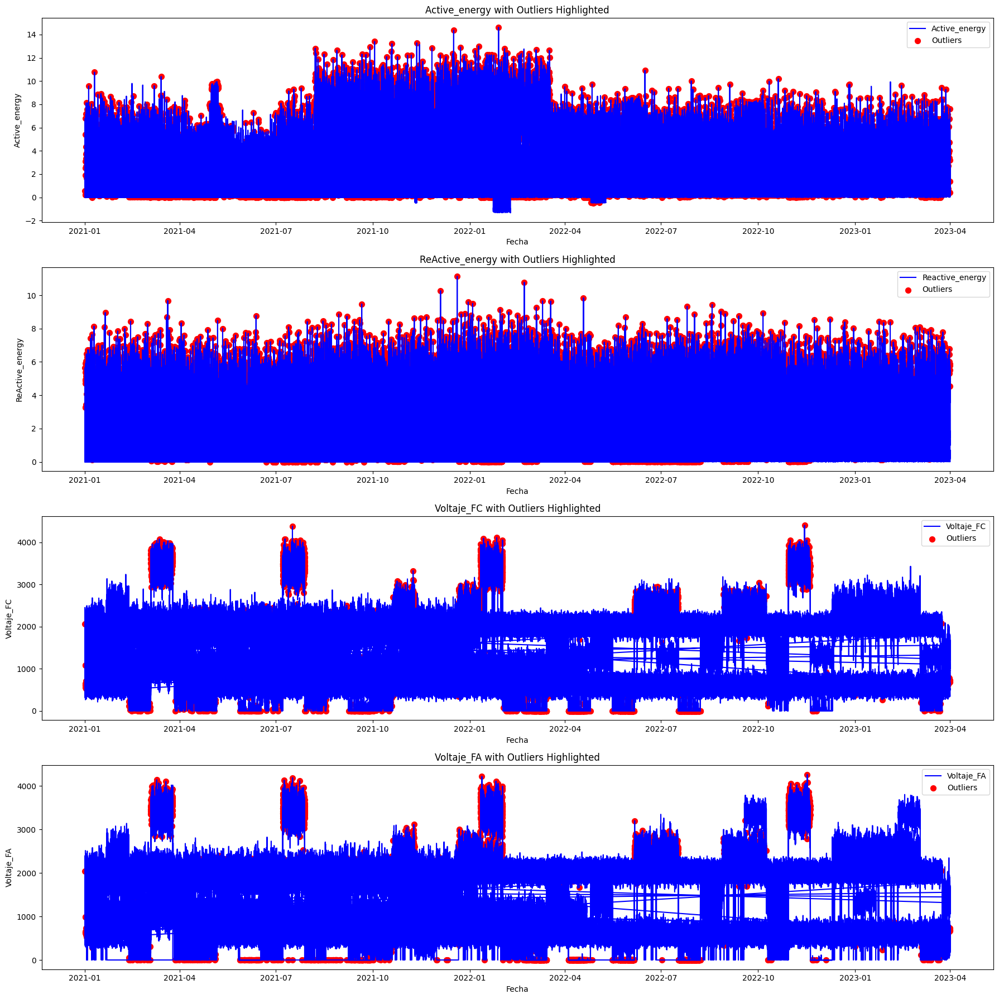

In [9]:
import matplotlib.pyplot as plt
import pandas as pd


df = pd.read_csv('../data/output/consumo_datamart_gold.csv')
combined_df = df.copy()
consistent_outliers_list= combined_df[combined_df['Anomaly_Global']==-1].index.tolist()
combined_df['Fecha'] = pd.to_datetime(combined_df['Fecha'])
fig, axs = plt.subplots(4, 1, figsize=(18, 18))  # 2 rows, 1 column

# Plot for Active_energy
axs[0].plot(combined_df['Fecha'], combined_df['Active_energy'], 'b-', label=f'Active_energy', markersize=5)
axs[0].scatter(combined_df.loc[consistent_outliers_list, 'Fecha'], combined_df.loc[consistent_outliers_list, 'Active_energy'], color='red', s=50, label='Outliers')
axs[0].set_title(f'Active_energy with Outliers Highlighted')
axs[0].set_xlabel('Fecha')
axs[0].set_ylabel('Active_energy')
axs[0].legend()

# Plot for Reactive_energy
axs[1].plot(combined_df['Fecha'], combined_df['Reactive_energy'], 'b-', label=f'Reactive_energy', markersize=5)
axs[1].scatter(combined_df.loc[consistent_outliers_list, 'Fecha'], combined_df.loc[consistent_outliers_list, 'Reactive_energy'], color='red', s=50, label='Outliers')
axs[1].set_title(f'ReActive_energy with Outliers Highlighted')
axs[1].set_xlabel('Fecha')
axs[1].set_ylabel('ReActive_energy')
axs[1].legend()

# Plot for Voltaje_FC
axs[2].plot(combined_df['Fecha'], combined_df['Voltaje_FC'], 'b-', label=f'Voltaje_FC', markersize=5)
axs[2].scatter(combined_df.loc[consistent_outliers_list, 'Fecha'], combined_df.loc[consistent_outliers_list, 'Voltaje_FC'], color='red', s=50, label='Outliers')
axs[2].set_title(f'Voltaje_FC with Outliers Highlighted')
axs[2].set_xlabel('Fecha')
axs[2].set_ylabel('Voltaje_FC')
axs[2].legend()

# Plot for Voltaje_FA
axs[3].plot(combined_df['Fecha'], combined_df['Voltaje_FA'], 'b-', label=f'Voltaje_FA', markersize=5)
axs[3].scatter(combined_df.loc[consistent_outliers_list, 'Fecha'], combined_df.loc[consistent_outliers_list, 'Voltaje_FA'], color='red', s=50, label='Outliers')
axs[3].set_title(f'Voltaje_FA with Outliers Highlighted')
axs[3].set_xlabel('Fecha')
axs[3].set_ylabel('Voltaje_FA')
axs[3].legend()


plt.tight_layout()

plt.show()


## 2.1 Anomalies Detection  Model Behavior  

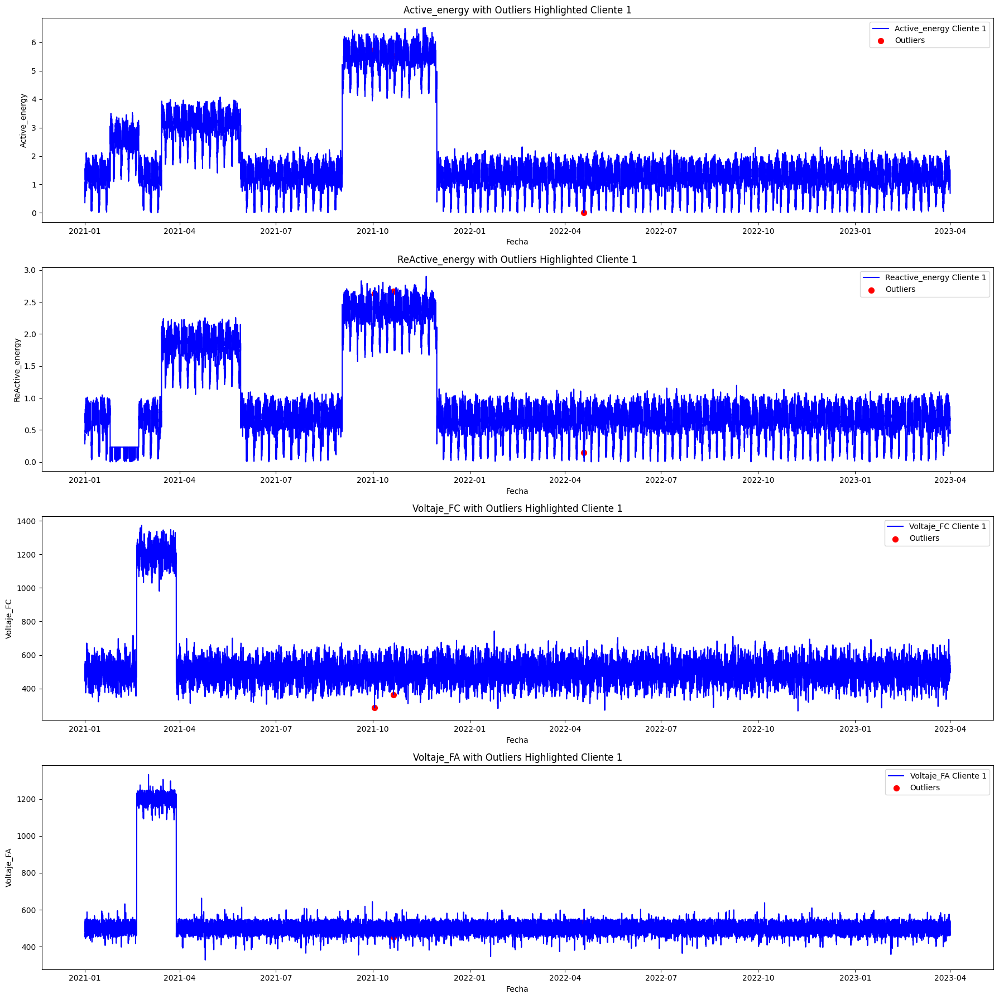

_______________________________________________________________


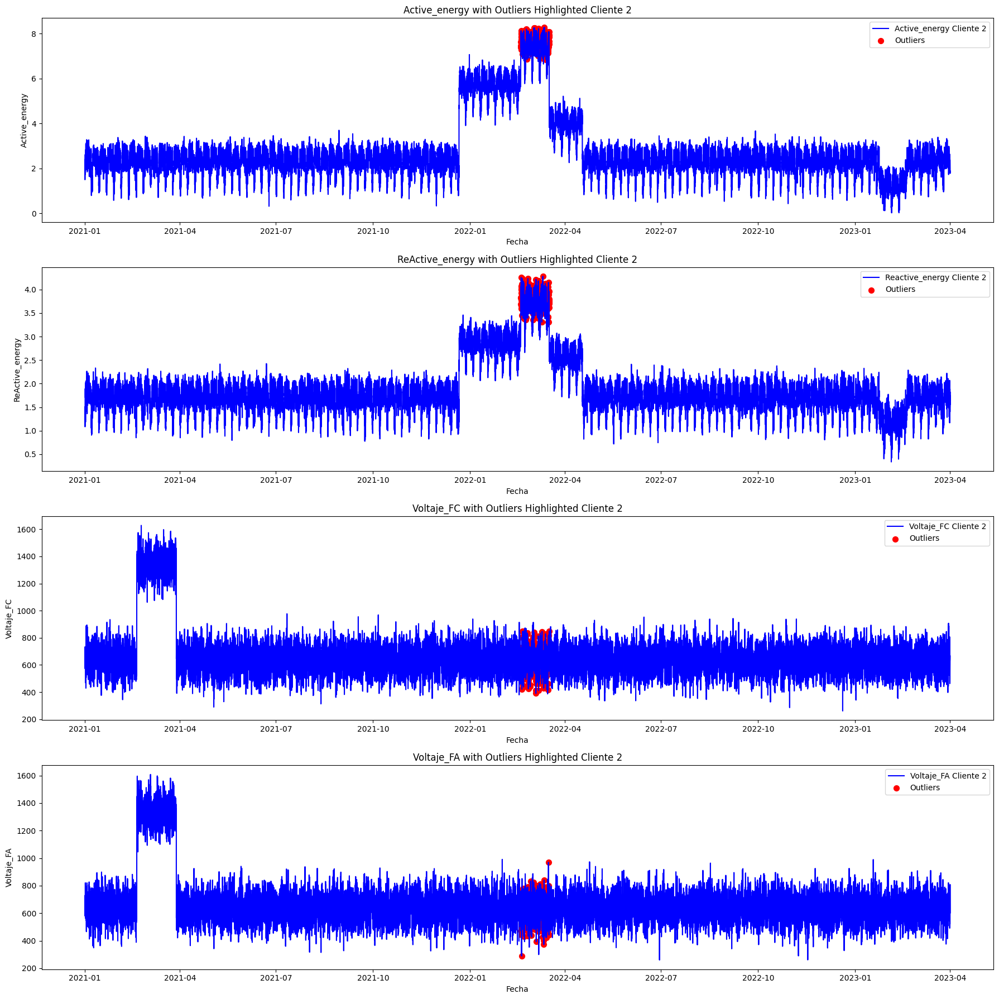

_______________________________________________________________


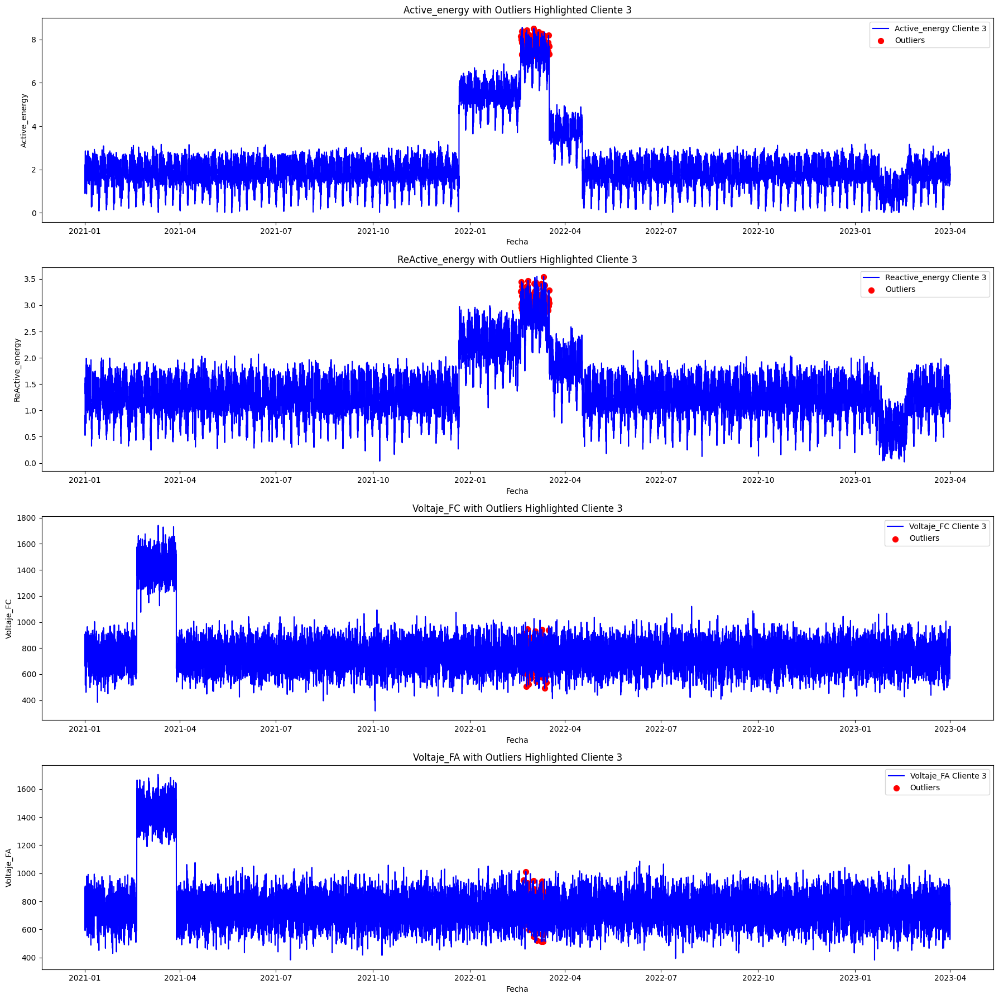

_______________________________________________________________


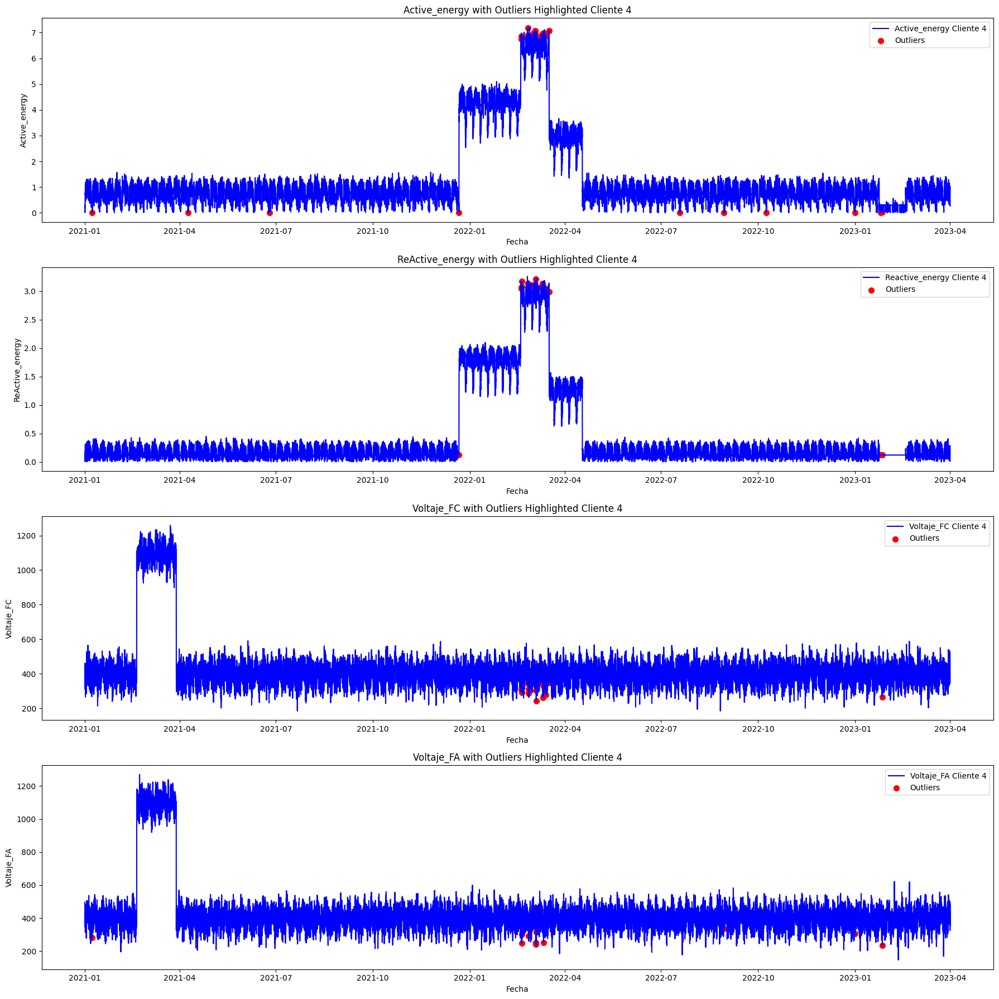

_______________________________________________________________


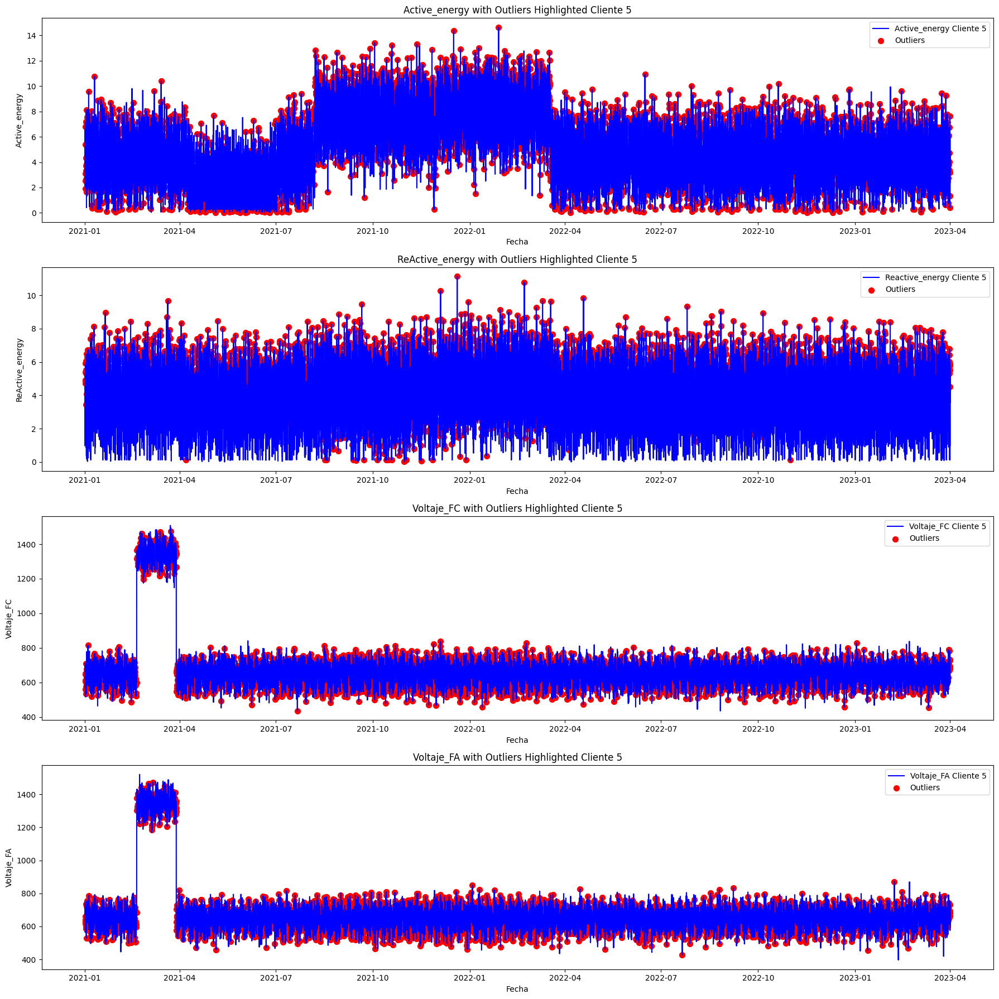

_______________________________________________________________


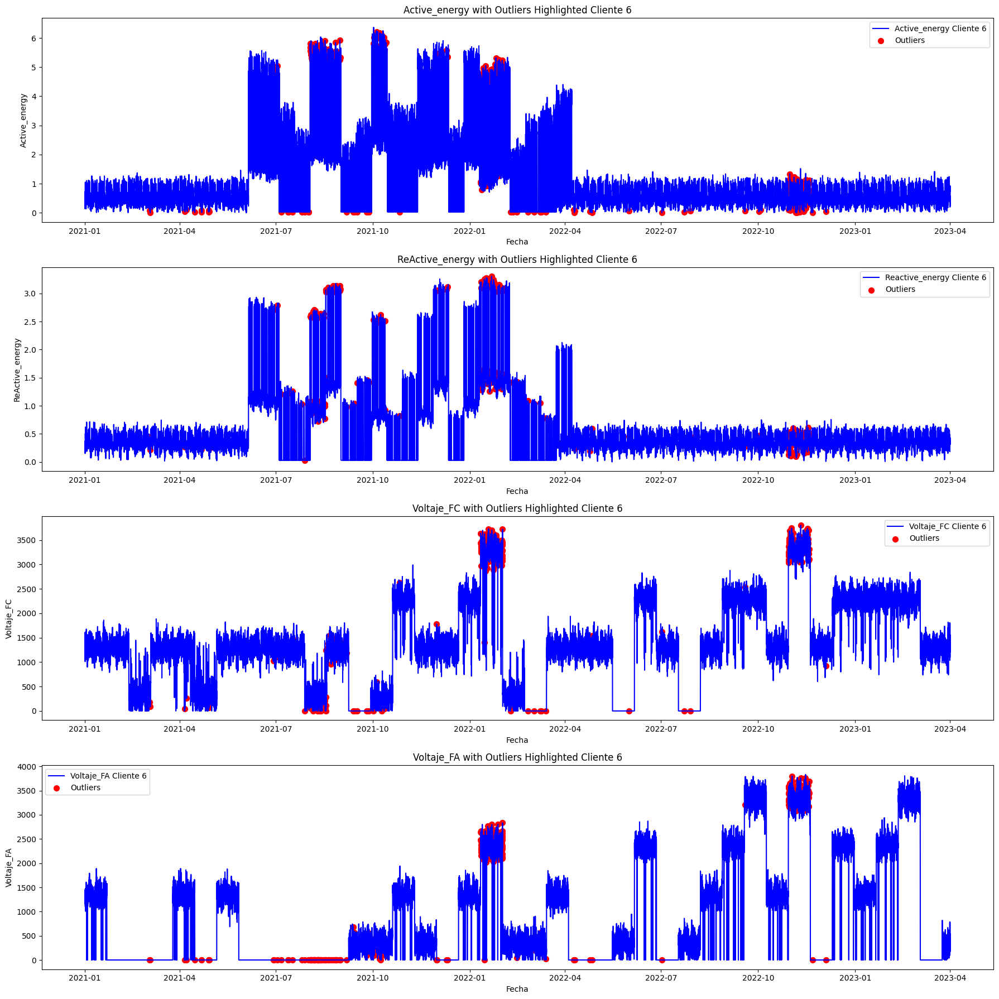

_______________________________________________________________


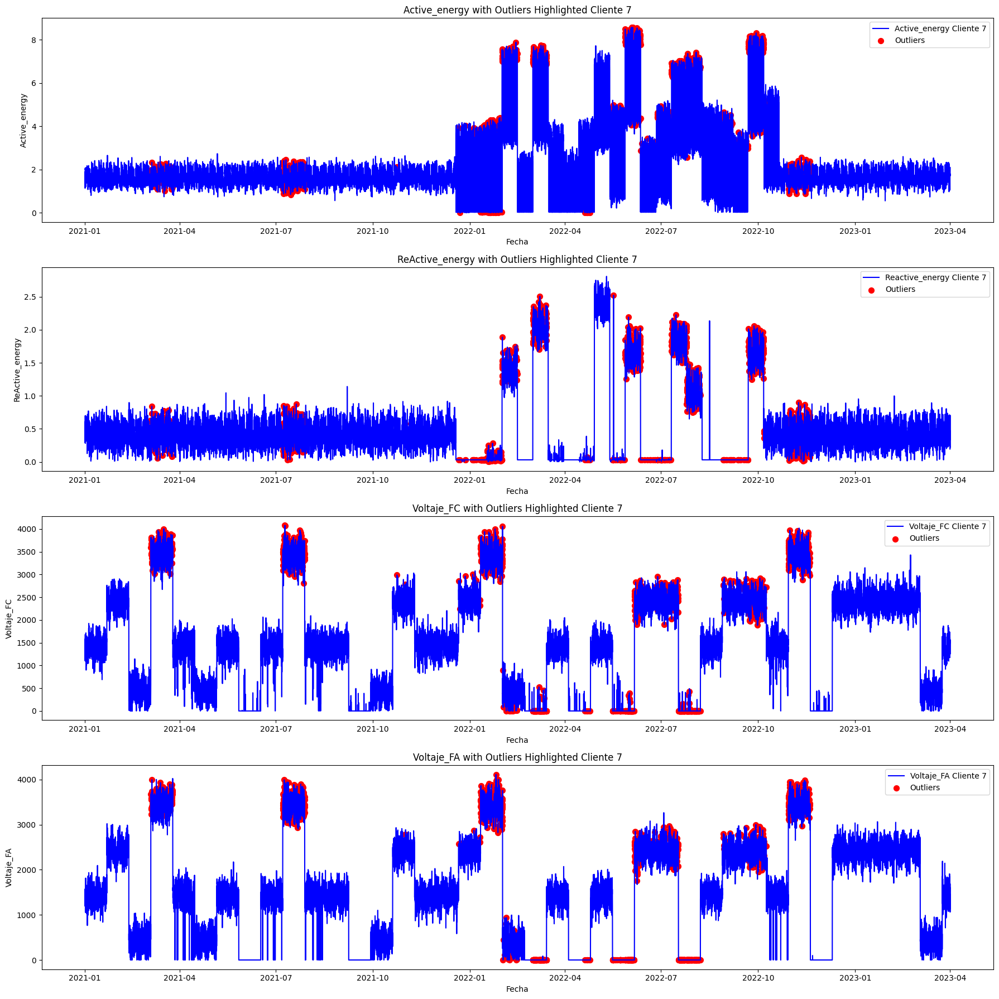

_______________________________________________________________


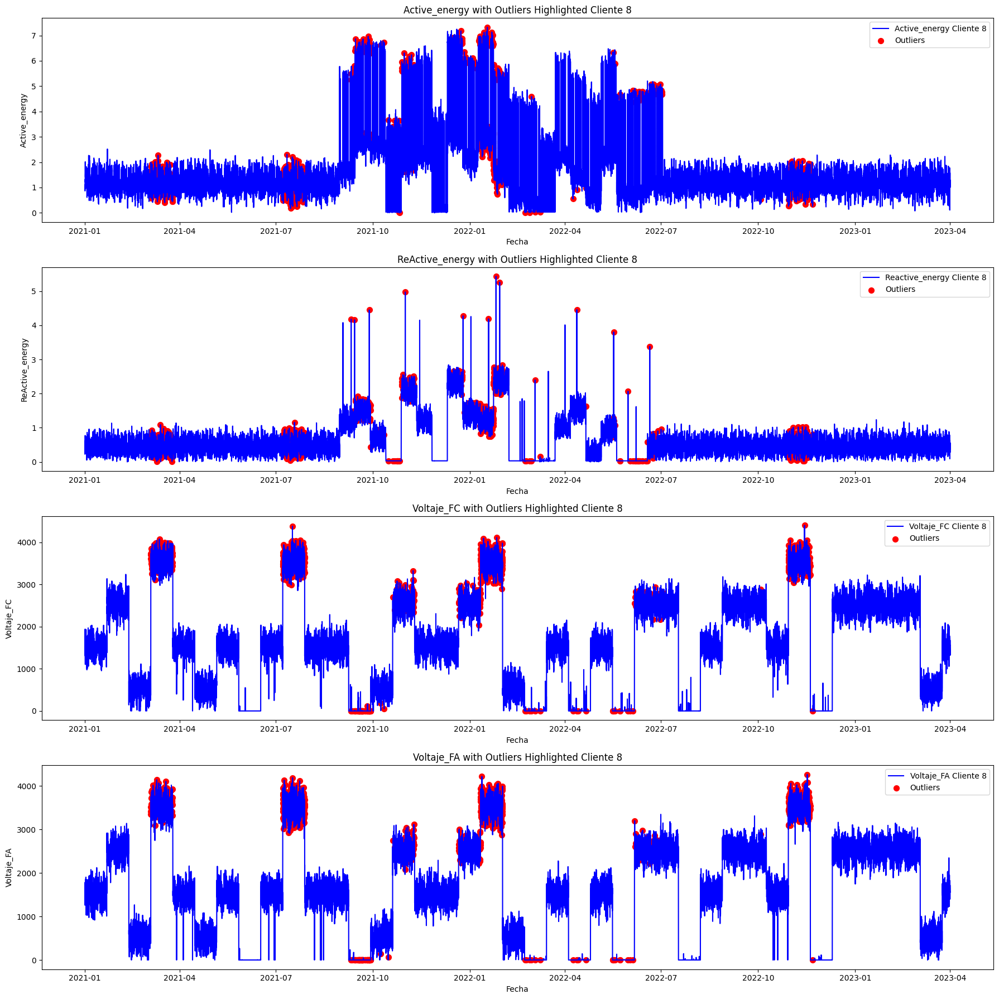

_______________________________________________________________


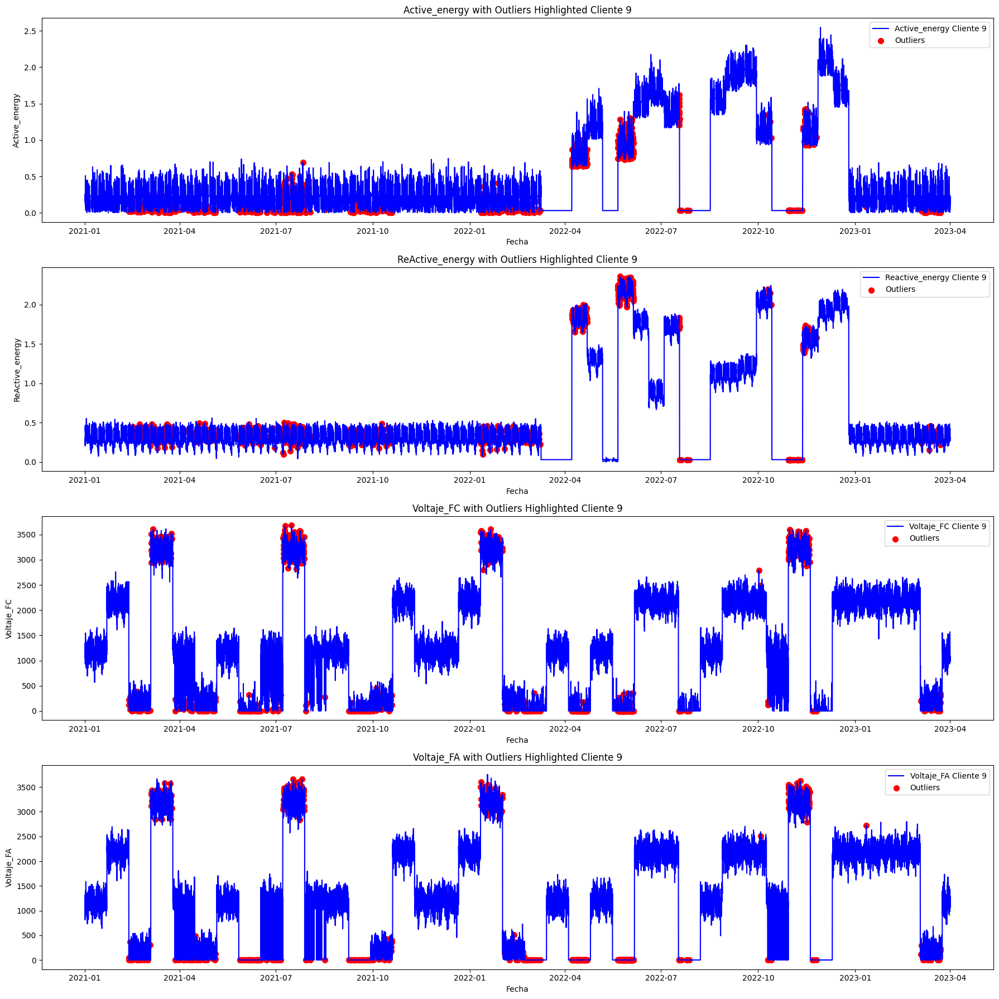

_______________________________________________________________


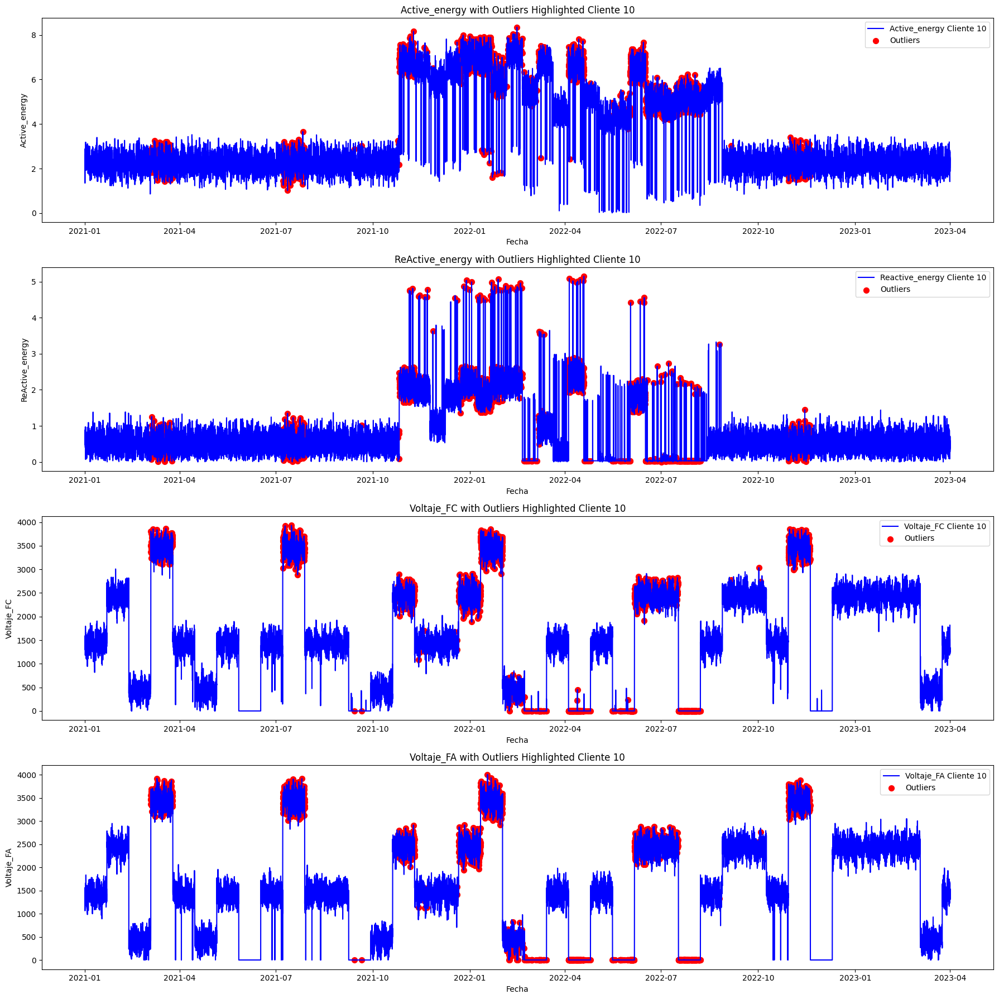

_______________________________________________________________


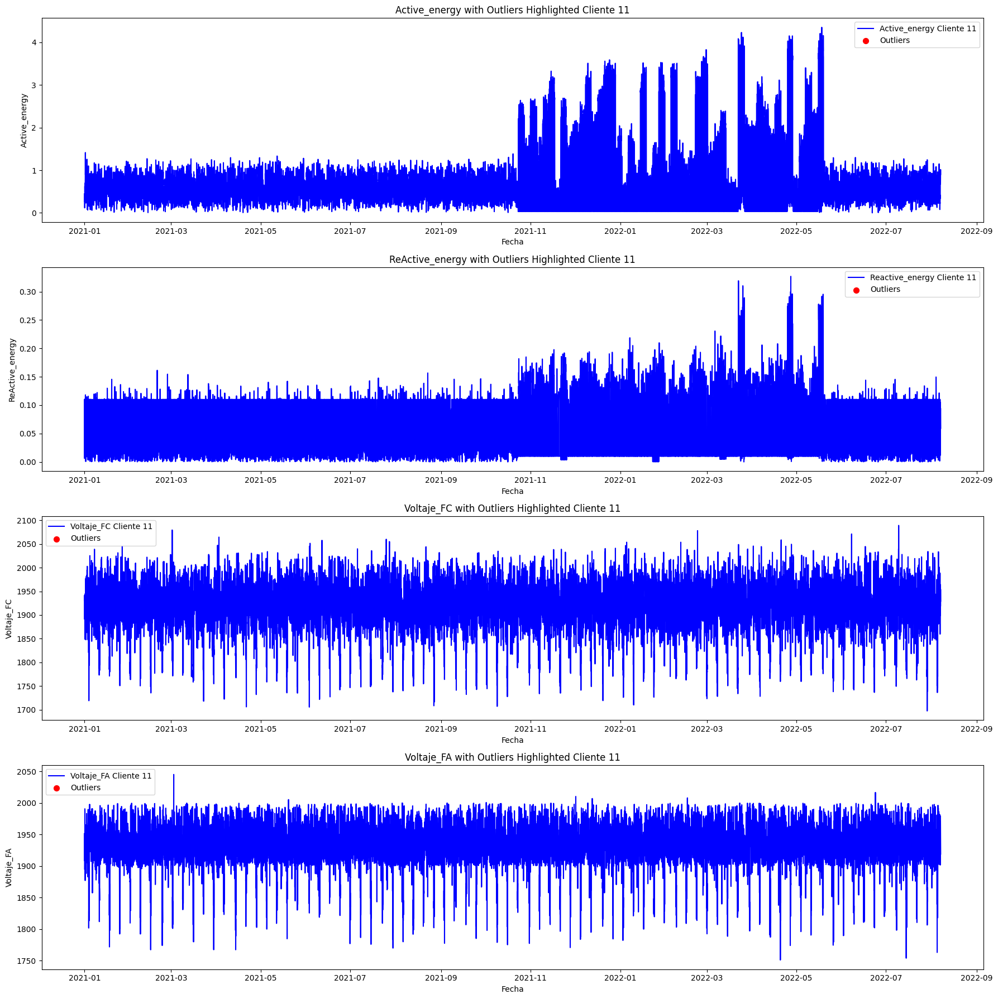

_______________________________________________________________


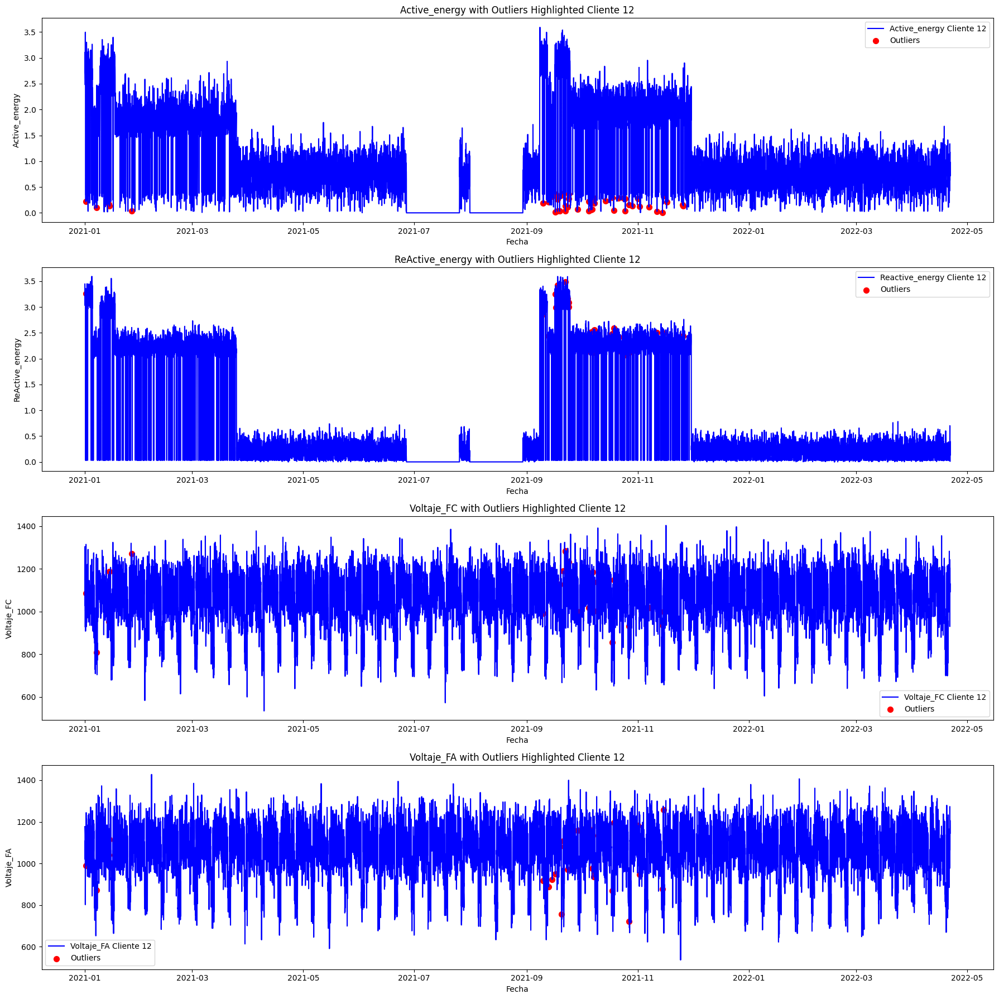

_______________________________________________________________


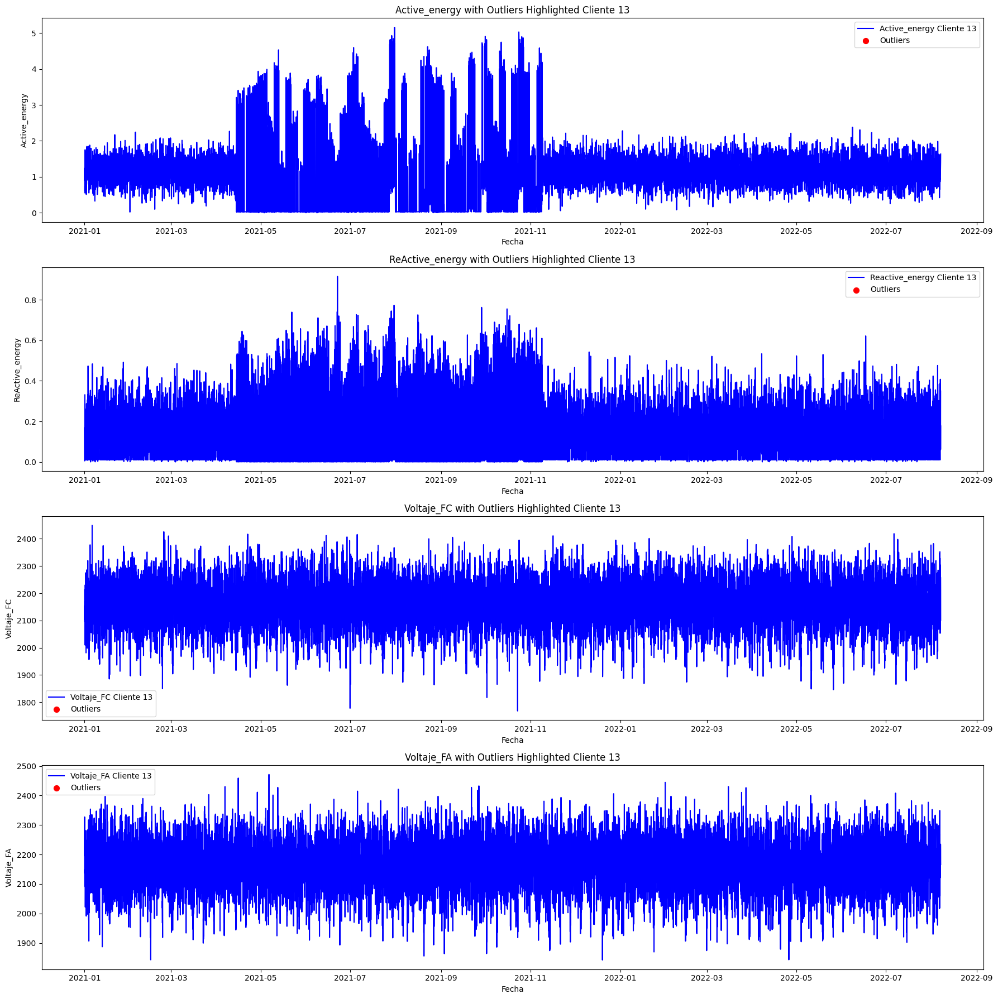

_______________________________________________________________


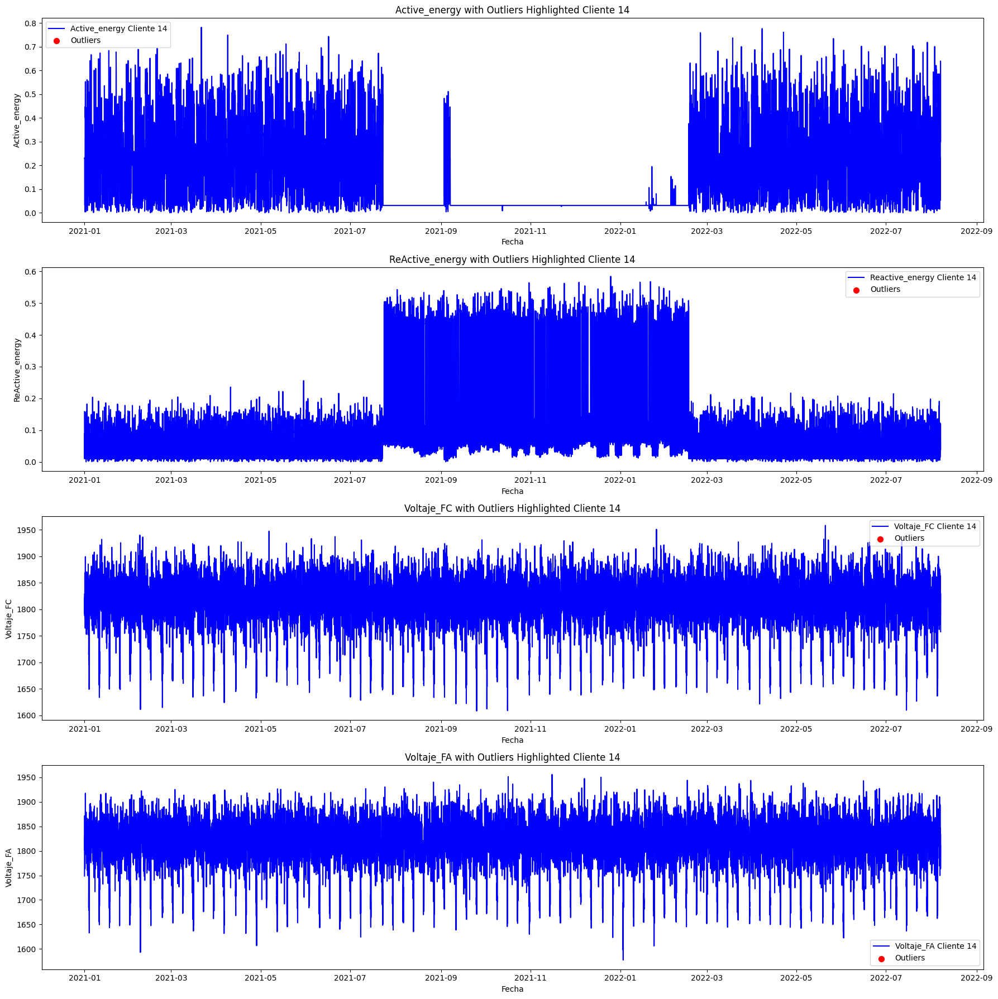

_______________________________________________________________


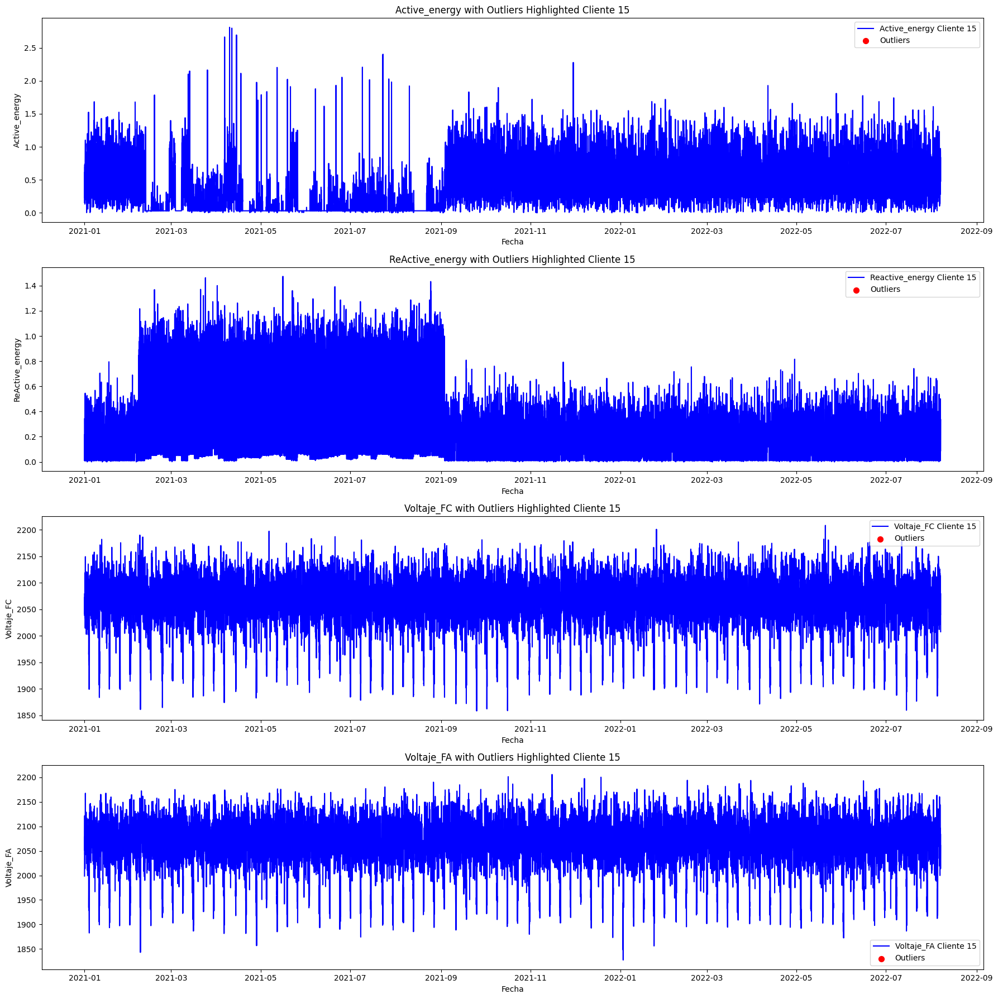

_______________________________________________________________


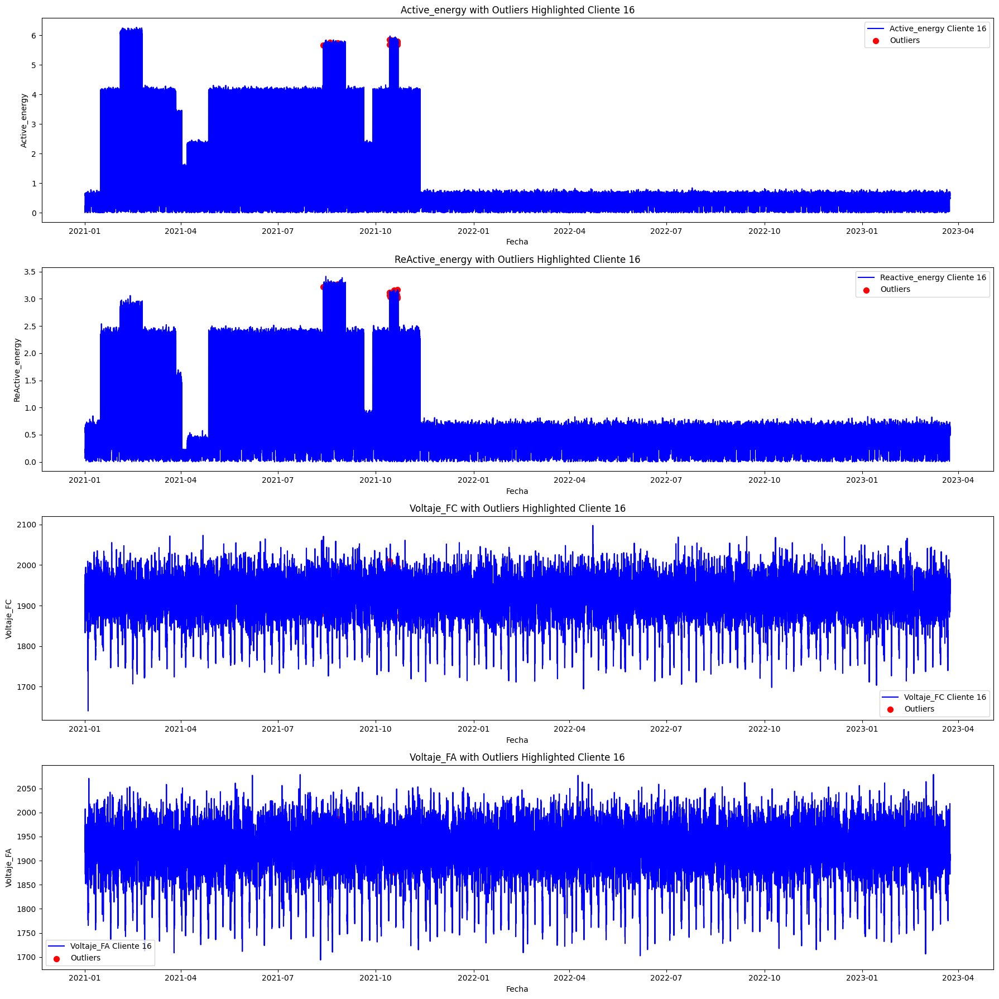

_______________________________________________________________


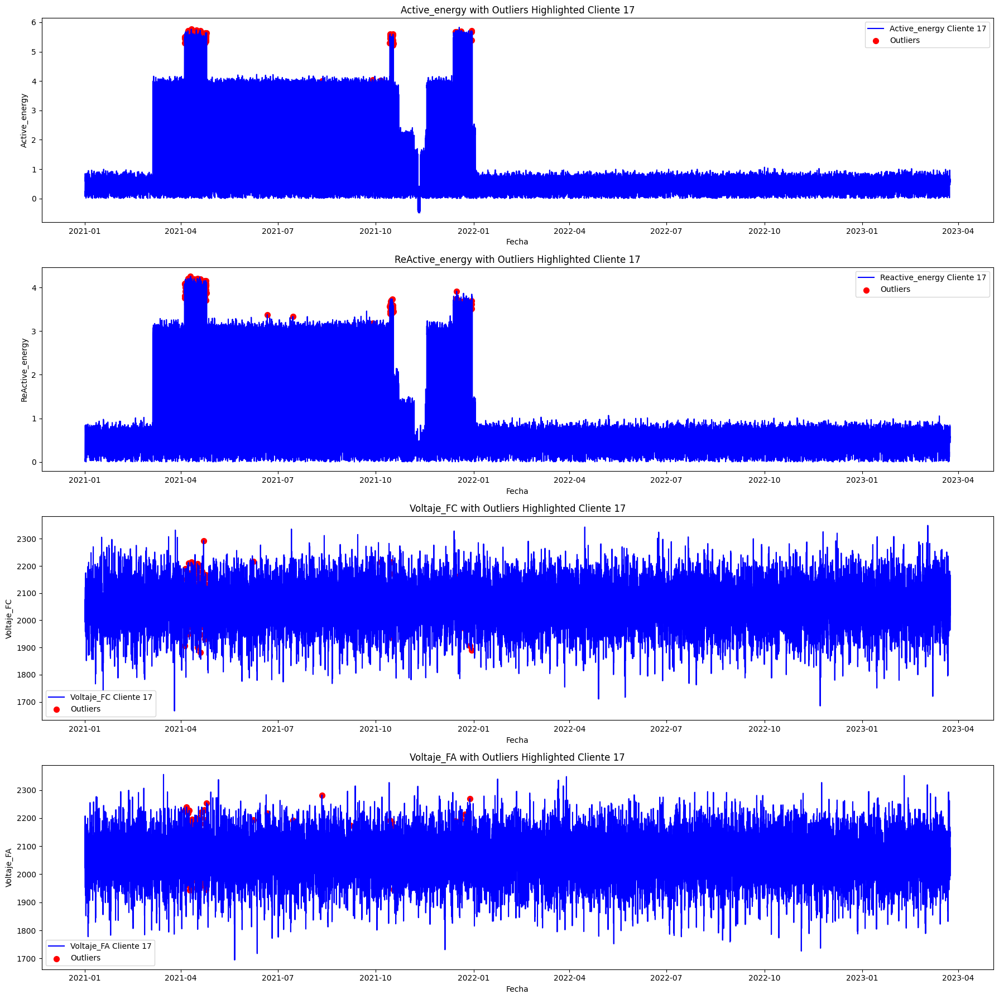

_______________________________________________________________


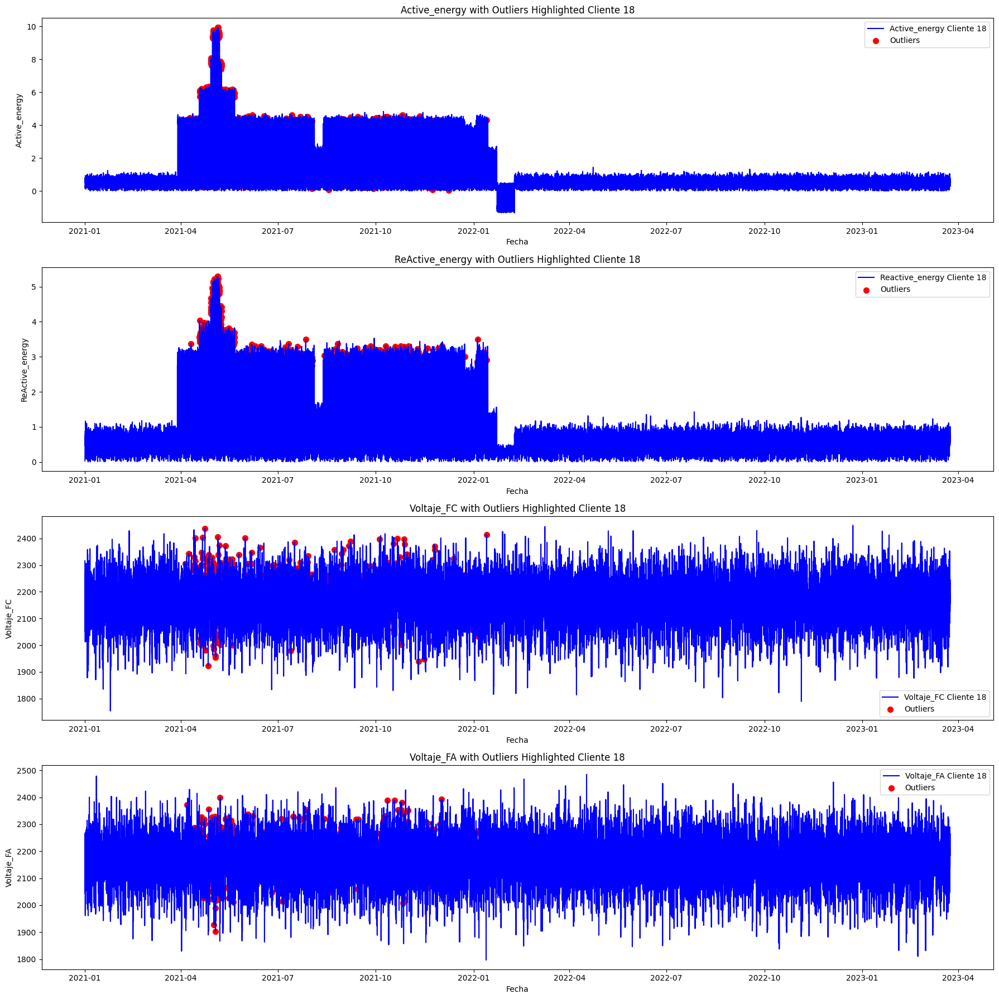

_______________________________________________________________


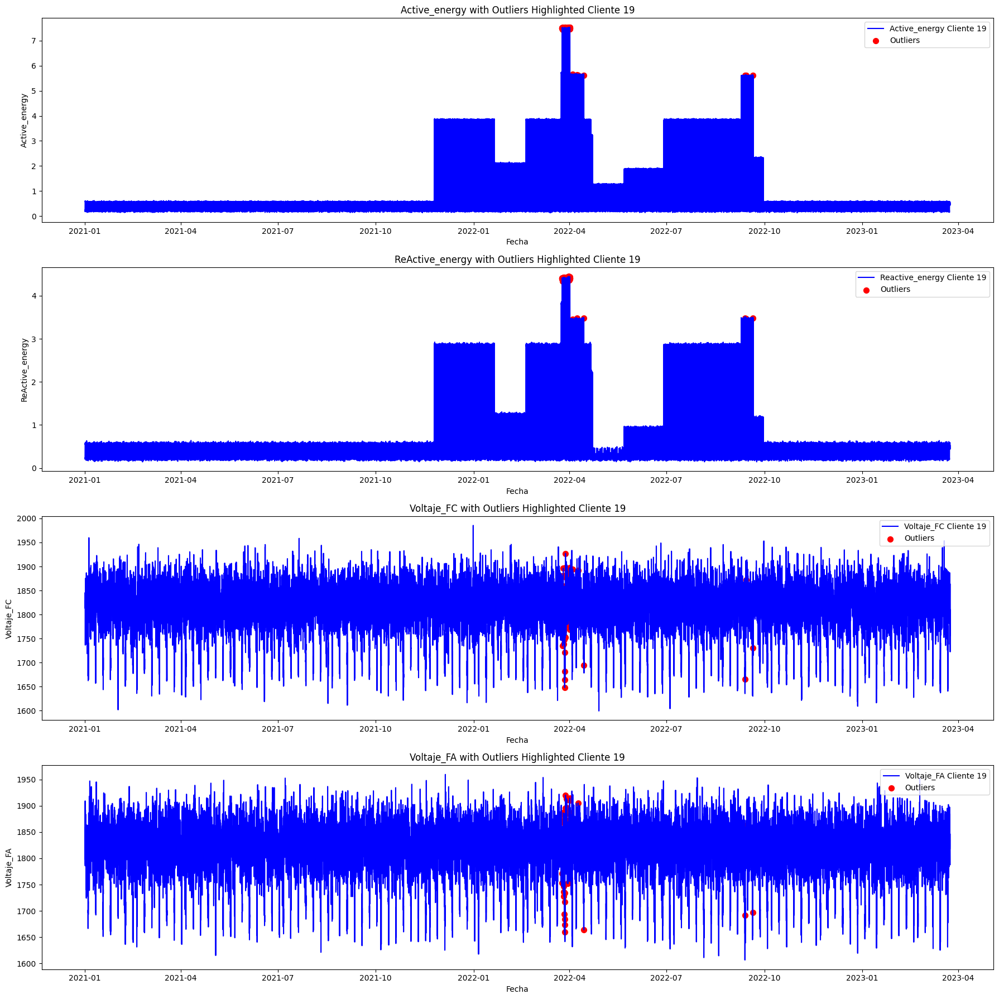

_______________________________________________________________


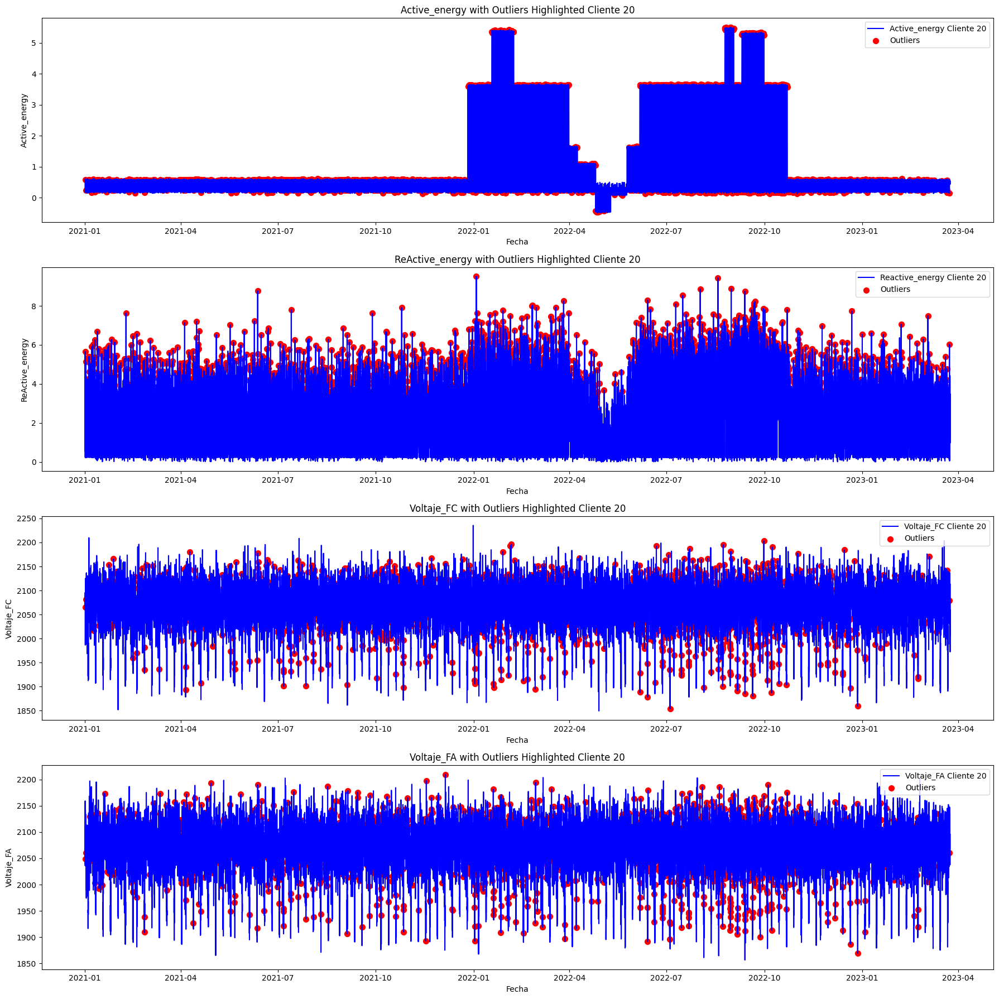

_______________________________________________________________


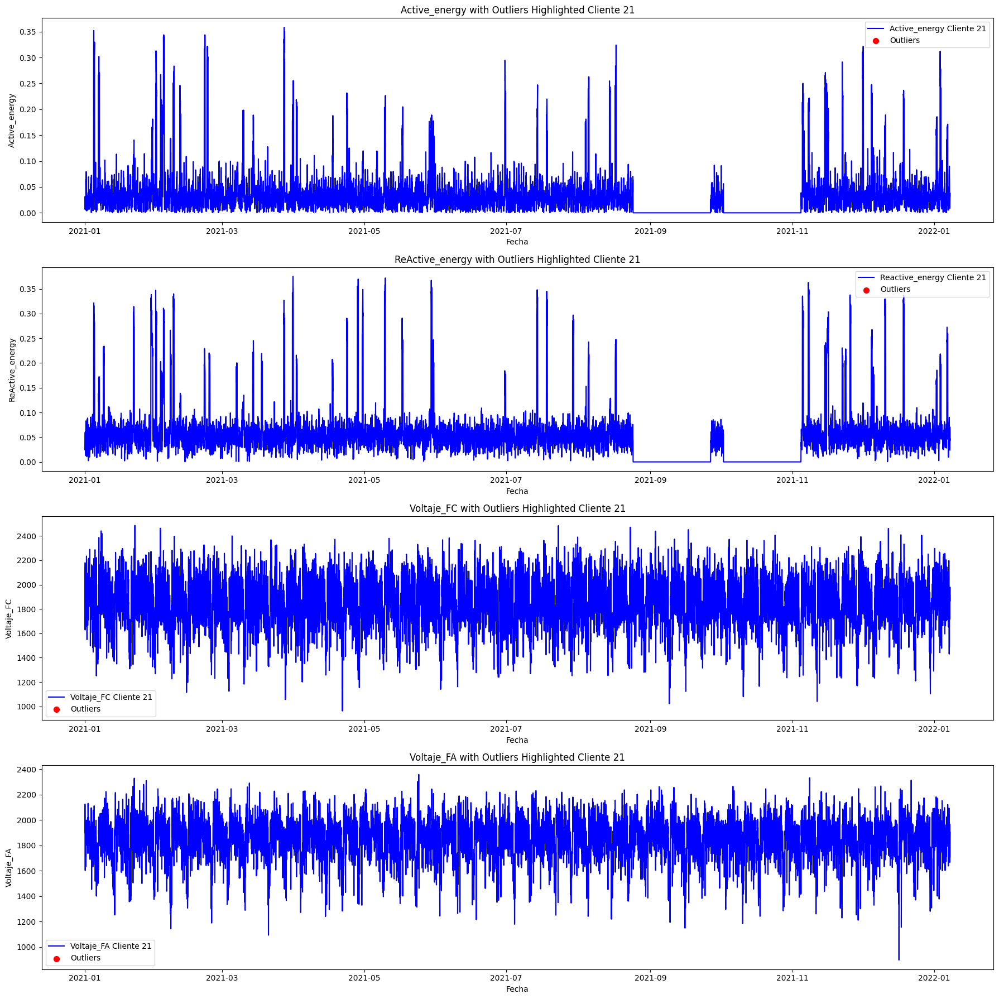

_______________________________________________________________


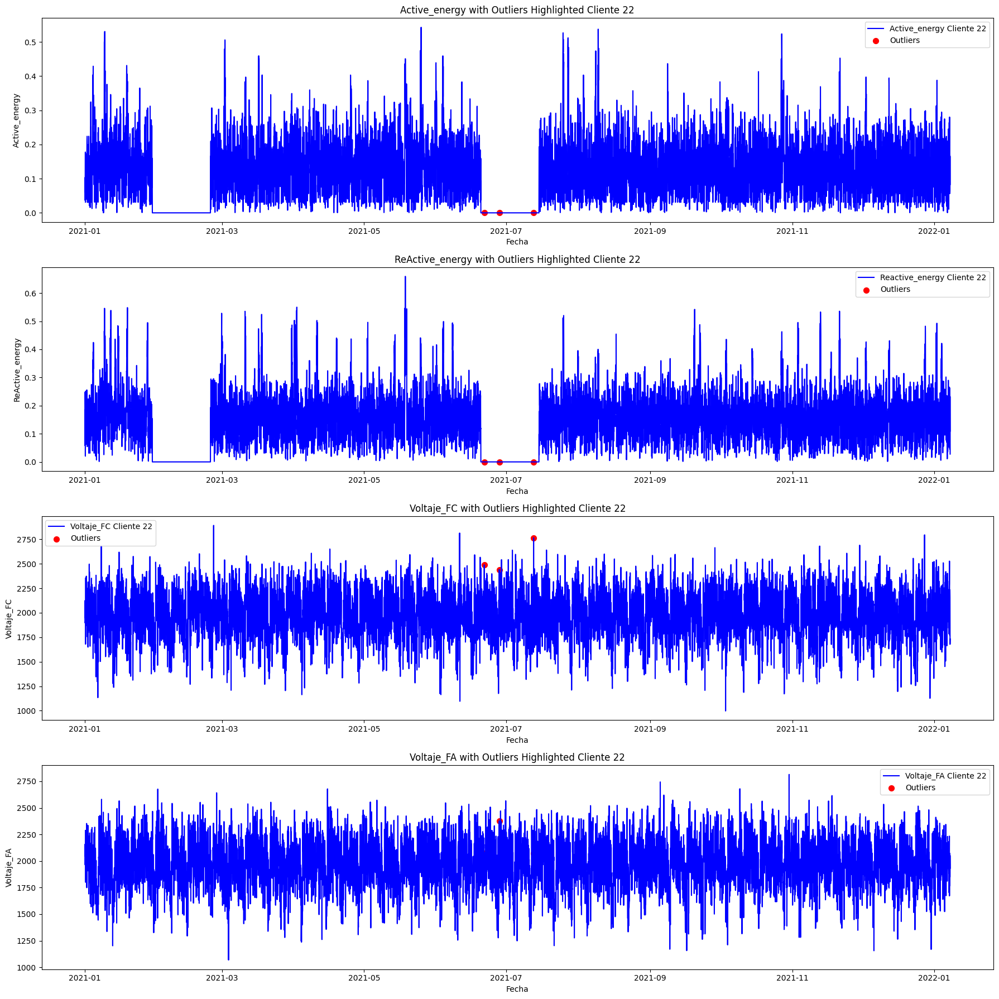

_______________________________________________________________


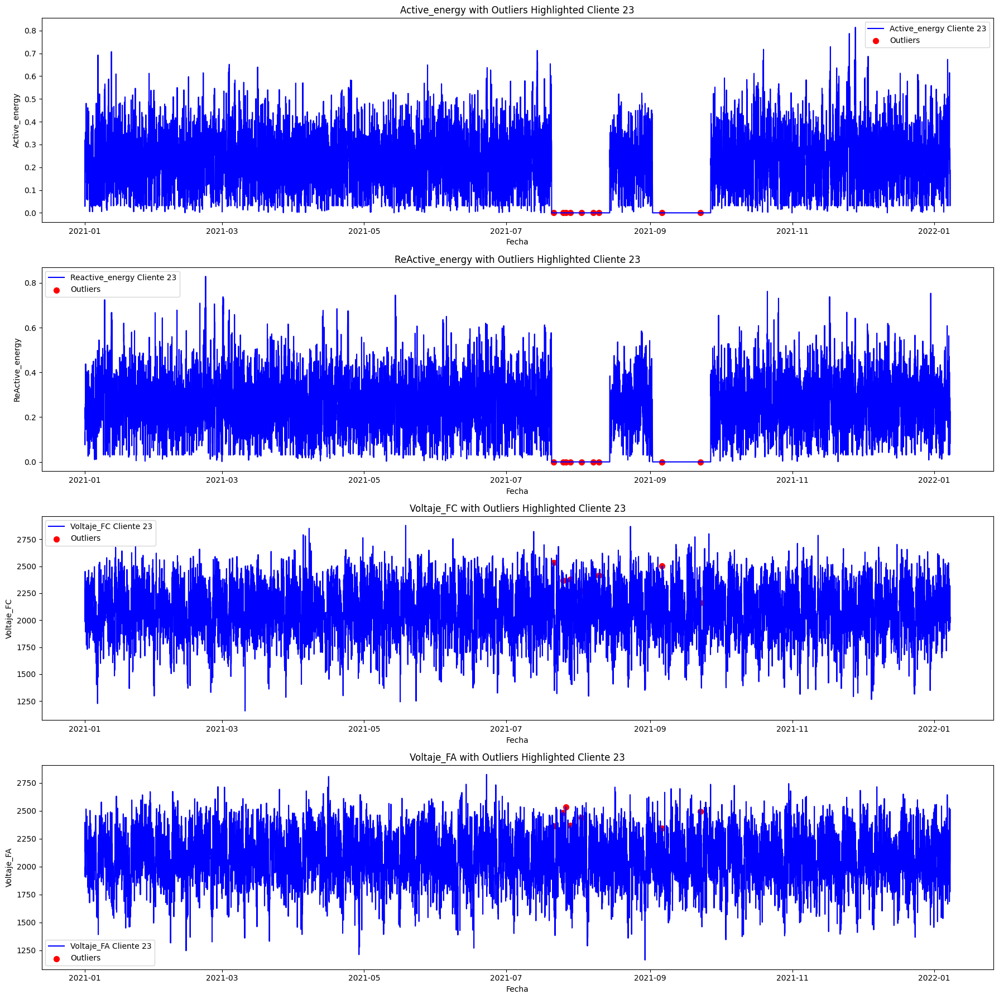

_______________________________________________________________


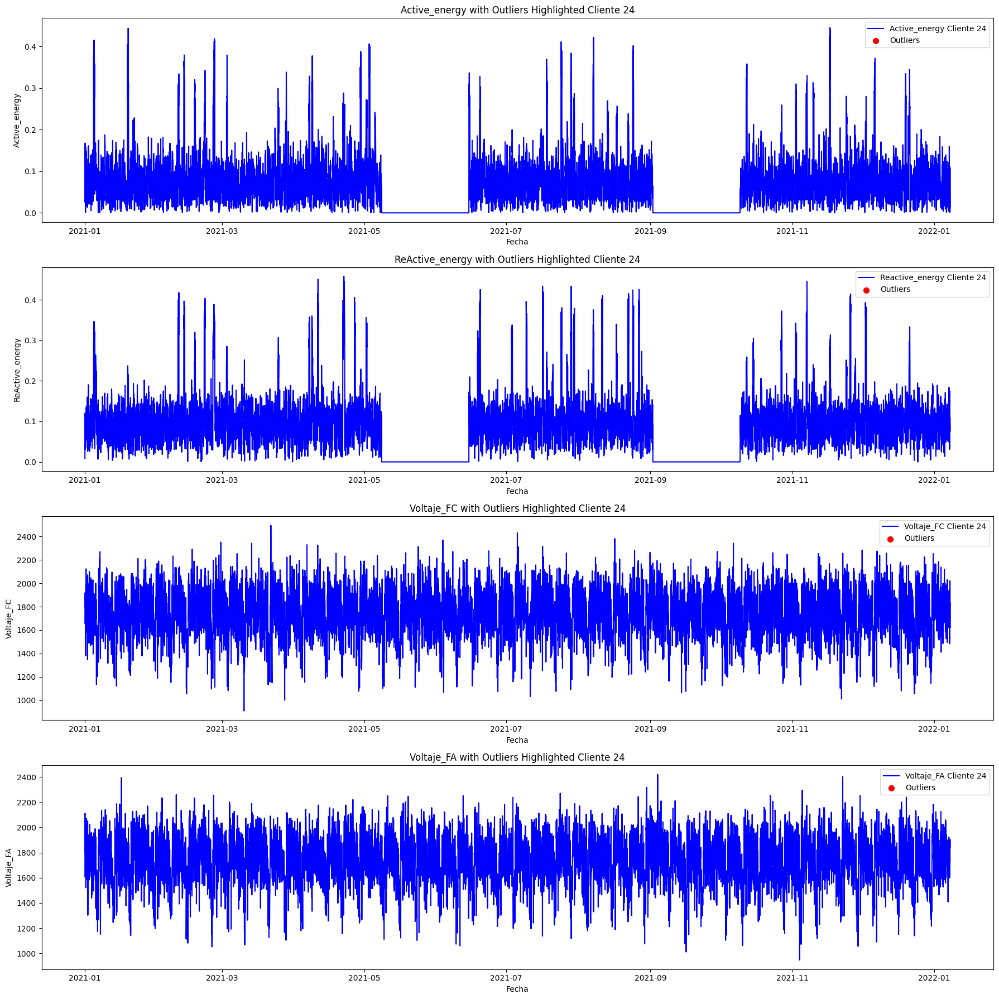

_______________________________________________________________


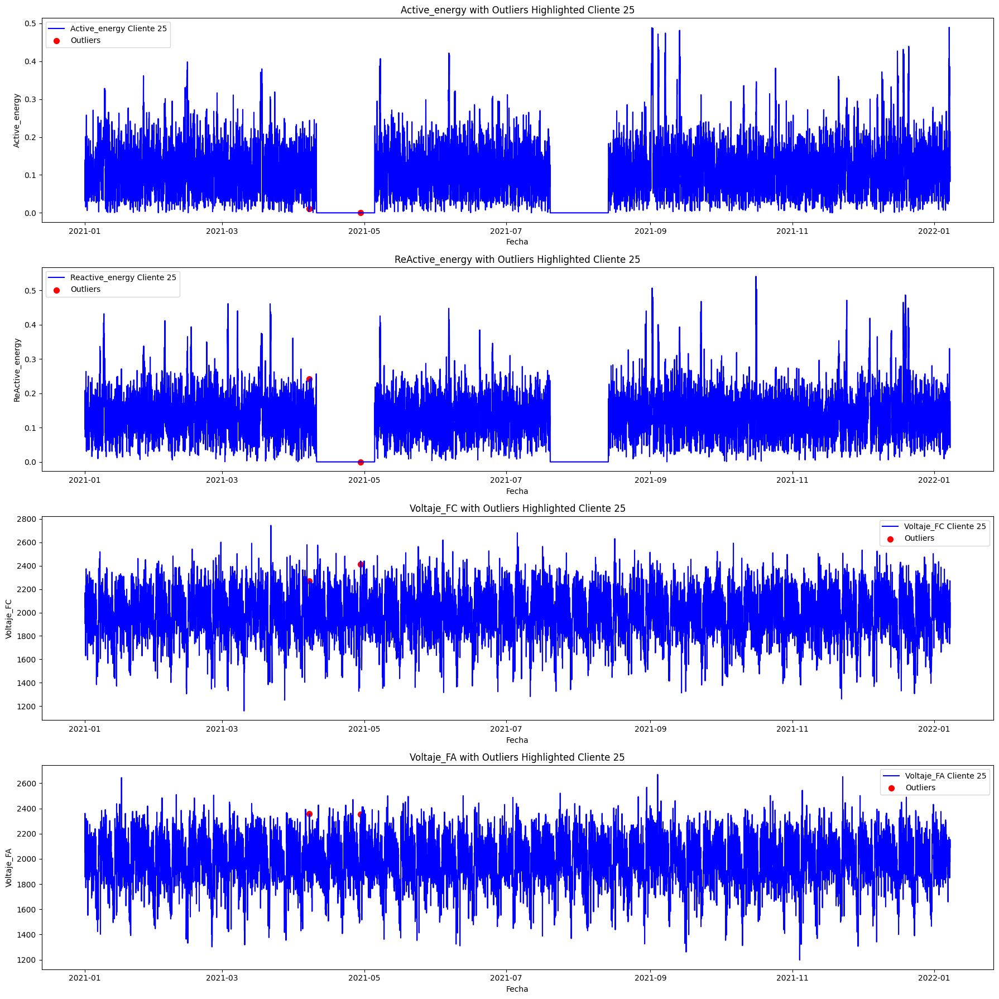

_______________________________________________________________


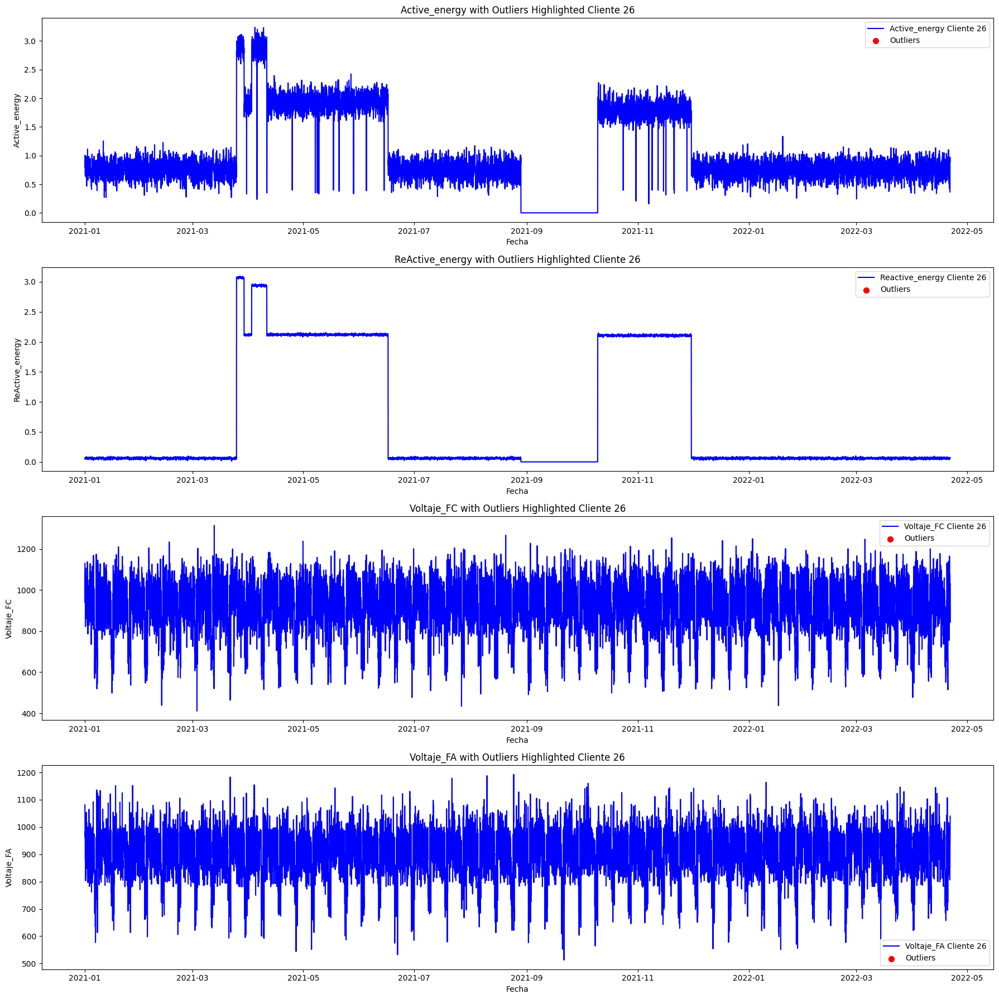

_______________________________________________________________


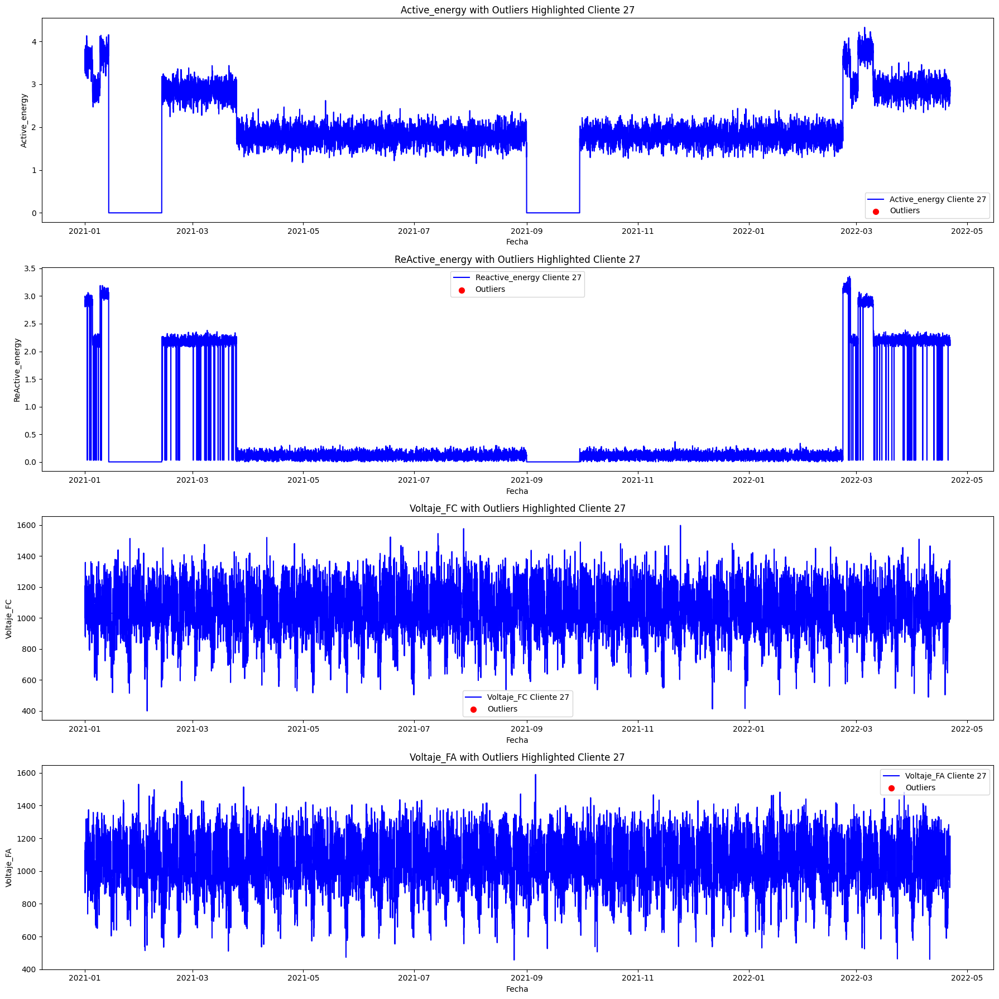

_______________________________________________________________


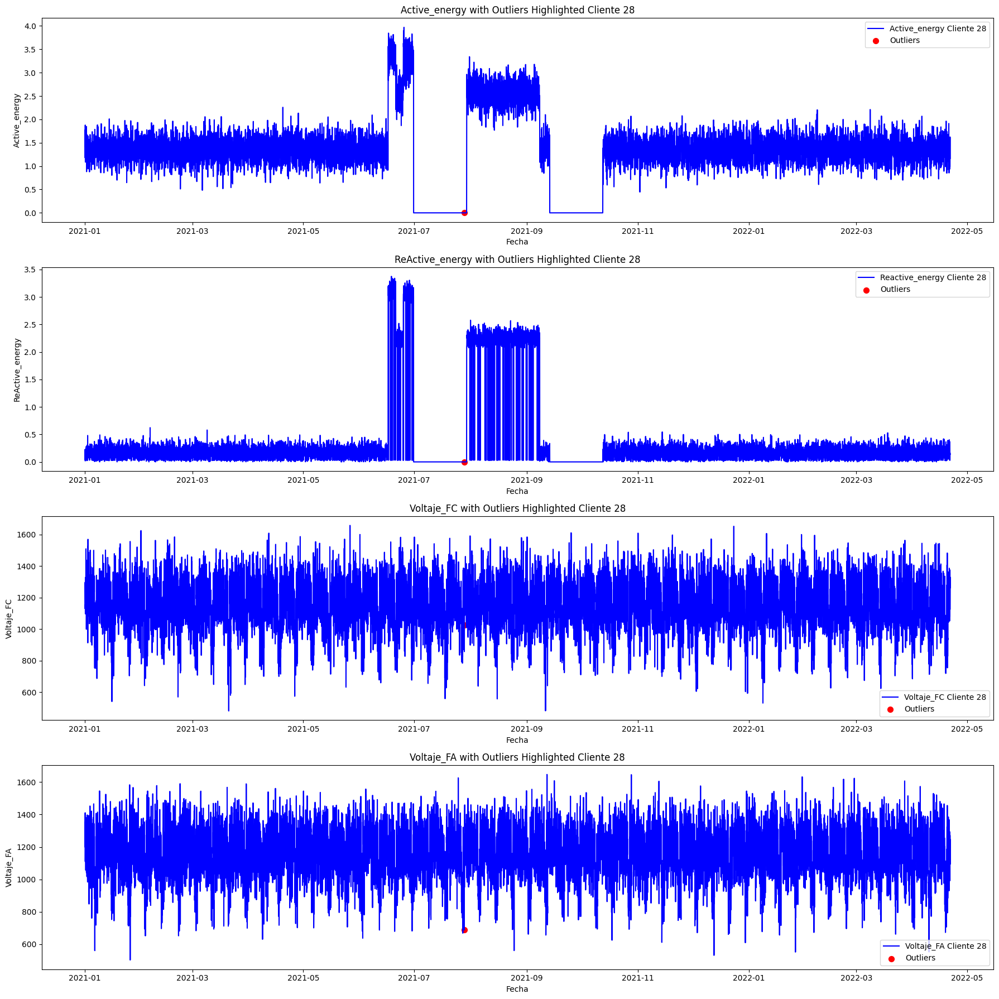

_______________________________________________________________


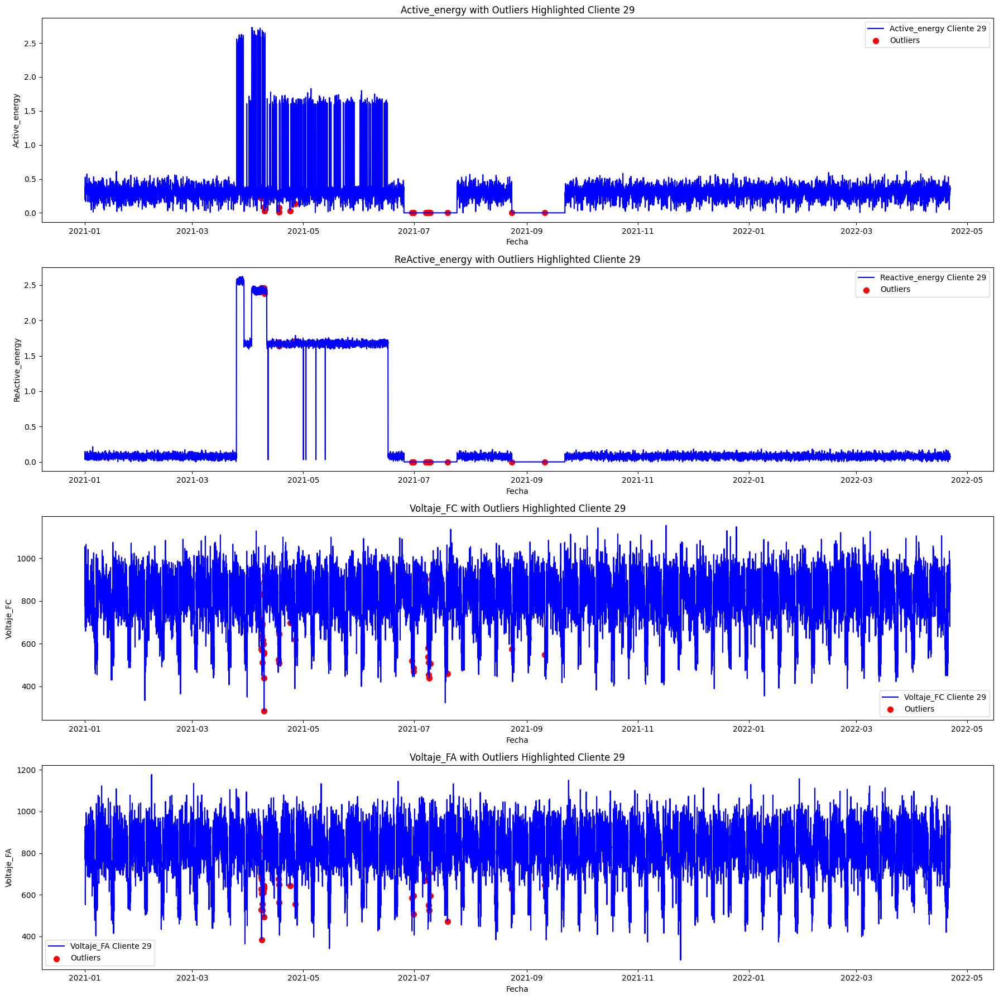

_______________________________________________________________


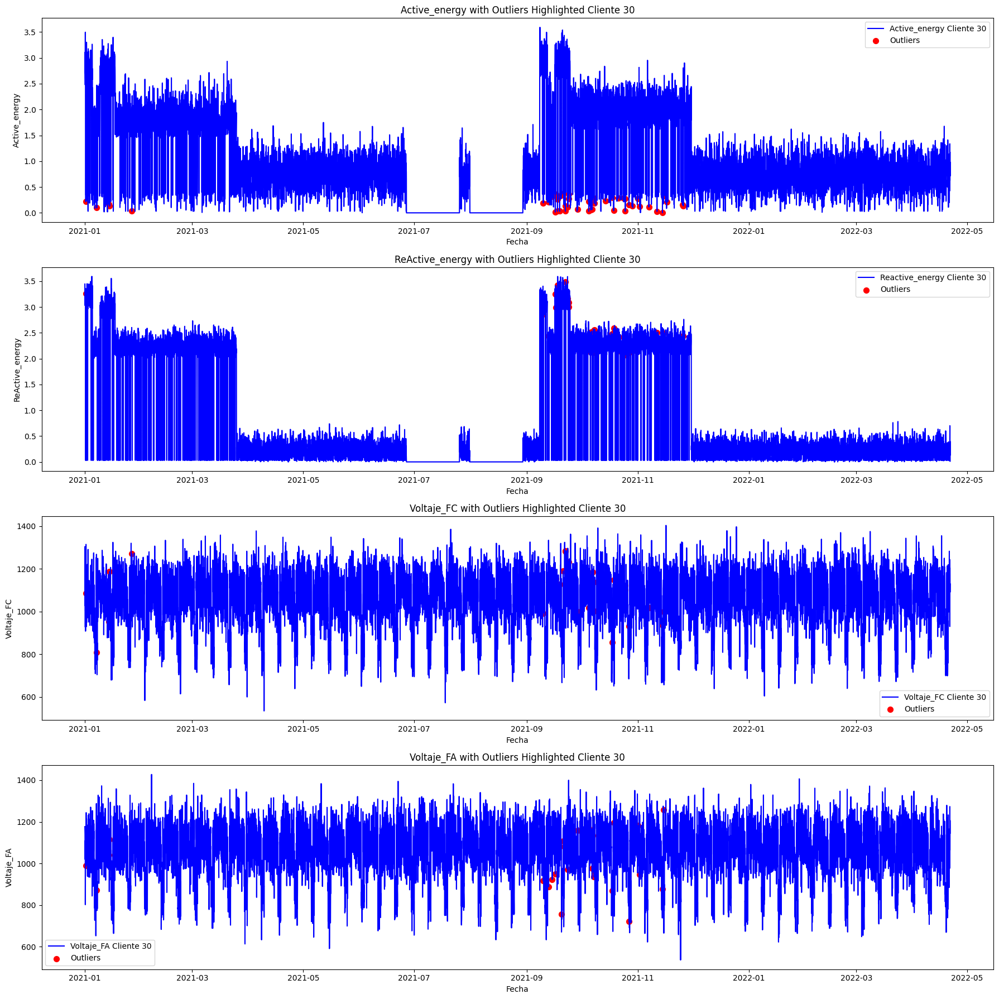

_______________________________________________________________


In [10]:
import matplotlib.pyplot as plt
import pandas as pd


df = pd.read_csv('../data/output/consumo_datamart_gold.csv')
for client in range(1,31):
    combined_df = df[df['ClienteId']==client]
    consistent_outliers_list= combined_df[combined_df['Anomaly_Global']==-1].index.tolist()
    combined_df['Fecha'] = pd.to_datetime(combined_df['Fecha'])


    fig, axs = plt.subplots(4, 1, figsize=(18, 18))  # 2 rows, 1 column

    
    # Plot for Active_energy
    axs[0].plot(combined_df['Fecha'], combined_df['Active_energy'], 'b-', label=f'Active_energy Cliente {client}', markersize=5)
    axs[0].scatter(combined_df.loc[consistent_outliers_list, 'Fecha'], combined_df.loc[consistent_outliers_list, 'Active_energy'], color='red', s=50, label='Outliers')
    axs[0].set_title(f'Active_energy with Outliers Highlighted Cliente {client}')
    axs[0].set_xlabel('Fecha')
    axs[0].set_ylabel('Active_energy')
    axs[0].legend()

    # Plot for Reactive_energy
    axs[1].plot(combined_df['Fecha'], combined_df['Reactive_energy'], 'b-', label=f'Reactive_energy Cliente {client}', markersize=5)
    axs[1].scatter(combined_df.loc[consistent_outliers_list, 'Fecha'], combined_df.loc[consistent_outliers_list, 'Reactive_energy'], color='red', s=50, label='Outliers')
    axs[1].set_title(f'ReActive_energy with Outliers Highlighted Cliente {client}')
    axs[1].set_xlabel('Fecha')
    axs[1].set_ylabel('ReActive_energy')
    axs[1].legend()

    # Plot for Voltaje_FC
    axs[2].plot(combined_df['Fecha'], combined_df['Voltaje_FC'], 'b-', label=f'Voltaje_FC Cliente {client}', markersize=5)
    axs[2].scatter(combined_df.loc[consistent_outliers_list, 'Fecha'], combined_df.loc[consistent_outliers_list, 'Voltaje_FC'], color='red', s=50, label='Outliers')
    axs[2].set_title(f'Voltaje_FC with Outliers Highlighted Cliente {client}')
    axs[2].set_xlabel('Fecha')
    axs[2].set_ylabel('Voltaje_FC')
    axs[2].legend()

    # Plot for Voltaje_FA
    axs[3].plot(combined_df['Fecha'], combined_df['Voltaje_FA'], 'b-', label=f'Voltaje_FA Cliente {client}', markersize=5)
    axs[3].scatter(combined_df.loc[consistent_outliers_list, 'Fecha'], combined_df.loc[consistent_outliers_list, 'Voltaje_FA'], color='red', s=50, label='Outliers')
    axs[3].set_title(f'Voltaje_FA with Outliers Highlighted Cliente {client}')
    axs[3].set_xlabel('Fecha')
    axs[3].set_ylabel('Voltaje_FA')
    axs[3].legend()

      plt.tight_layout()

    plt.show()
    print("_______________________________________________________________")
